# `Clasificador_texturas.ipynb`

## 0. Cargamos el dataset

El dataset que vamos a emplear es el [Kylberg Texture Dataset](https://filedn.com/lkCRue0RhPO7ercIrqFRl2Y/datasets/KylbergTextureDatasetV1/) que cuenta con un total de 240 imágenes con 6 texturas diferentes. El dataset está balanceado, por tanto, hay 40 imágenes por textura.

El tamaño de las imágenes es el mismo para todas ellas, siendo de 576x576 píxeles.

In [1]:
from dataset_loader.loader import load_split_data, plot_N_images
import cv2

X_train, y_train, X_val, y_val, X_test, y_test = load_split_data(cv2.IMREAD_GRAYSCALE,
                                                             flag_summary=True, train_ratio =0.7,
                                                             val_ratio=0.3, balanced_labels=True)

Has all the images same size? Yes
The size of all the images is: (576, 576)

Number of images per class:
  seat2: 40 images
  stone1: 40 images
  canvas1: 40 images
  cushion1: 40 images
  sand1: 40 images
  linsseeds1: 40 images
Number of train images: 168
  - canvas1: 28 images
  - cushion1: 28 images
  - linsseeds1: 28 images
  - sand1: 28 images
  - seat2: 28 images
  - stone1: 28 images

Number of validation images: 72
  - canvas1: 12 images
  - cushion1: 12 images
  - linsseeds1: 12 images
  - sand1: 12 images
  - seat2: 12 images
  - stone1: 12 images

Number of test images: 0
  (no test split)


A continuación se muestra un breve ejemplo del aspecto visual de 6 texturas diferentes.

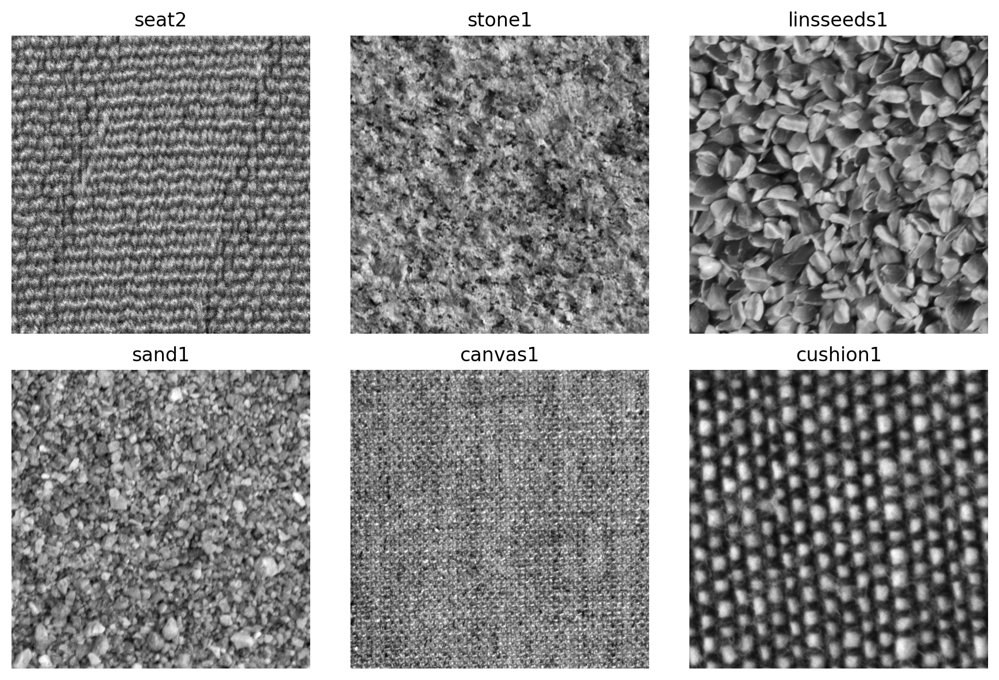

In [2]:
import numpy as np

clases = np.unique(y_train)
small_set_imgs = []
small_set_labels = []
for label in clases:
    indices_primera_clase = np.where(y_train == label)[0]
    random_index = np.random.choice(indices_primera_clase)
    small_set_imgs.append(X_train[random_index])
    small_set_labels.append(y_train[random_index])

plot_N_images(small_set_imgs, small_set_labels, balanced = True, N=6, max_cols=3, random=True)

Seleccionamos un ejemplo que servirá de referencia para estudiar los descriptores locales y globales. Luego se automatizará el proceso para todas las imágenes con su posterior clasificación con modelo de Machine Learning.

In [3]:
idx = 0
sample_image = X_train[idx]
sample_label = y_train[idx]

## 1. Análisis de los Descriptores Globales

### Histogram of oriented gradients - HOG

HOG es un descriptor de características que utiliza la distribución (histogramas) de los gradientes de dirección. Los gradientes de una imagen, son gradientes en el eje `x` e `y` y son muy importantes ya que cuando estamos ante un borde o una esquina de la imagen, la magnitud del gradiente es mayor.

Nota: el HOG se realiza por zonas de la imagen, y sería un descriptor local, pero al concatenar todos los descriptores, se obtiene un descriptor global.

El HOG se divide en 5 pasos:
1. **Preprocesamiento:** para convertir la imagen a escala de grises.
2. **Cálculo de gradientes:** se calcula los graadientes de la imagen en `x` e `y` y luego extraemos tanto la magnitud como la dirección de los gradientes.

    Para calcular los gradientes se utiliza la matriz de Sobel:
    
    - Filtro Horizontal
    
    $$G_x =
    \begin {bmatrix}
    -1 & 0 & 1 \\
    -2 & 0 & 2 \\
    -1 & 0 & 1
    \end {bmatrix}$$
    - Filtro Vertical
    $$
    G_y =
    \begin {bmatrix}
    -1 & -2 & -1 \\
    0 & 0 & 0 \\
    1 & 2 & 1
    \end {bmatrix}
    $$

    El gradiente se calcula como:
    $$
    \theta = arctan(G_y/G_x)
    $$
    Y la magnitud como:
    $$
    M = \sqrt{G_x^2 + G_y^2}
    $$

3. **Cálculo de histogramas** en este paso la imagen es dividida celdas de MxM píxeles (típicamente 8x8), y para cada celda se calcula el histograma de gradientes. Este hisograma de gradientes es de 9 *bins* que dividen los gradientes de 0 a 180 grados, es decir, cada bin representa un ángulo de 20 grados (bin0: [0,20), bin1: [20,40), bin2: [40,60), etc.).
4. **Normalización del bloque:**  Una vez calculados los histogramas de los gradientes para cada celda, el siguiente paso es agrupar las celdas en bloques y normalizar el vector de características de cada bloque para reducir la seinsibilidad a los cambios de iluminación.

    Un bloque se define como una matriz de N x N celdas, típicamente 2x2 y si una celda tiene 8x8 píxeles, entonces el bloque tendrá 16x16 píxeles. Como cada celda aporta un histograma de 9 bins y un bloque de 2x2 celdas, al concatenar los histogramas de las 4 celdas, el descriptor de HOG para una ventana de 16x16 píxeles tendrá 36 *bins*, que serán concatenados para formar el descriptor de la ventana y estarán normalizados con la norma L2.

5. **Concatenación de descriptores:** este proceso se repite para todas las ventanas de la imagen y se concatenan todos los descriptores para formar el descriptor final de la imagen.

    Como la imagen es de 576x576 píxeles, y se utiliza 1 bloque de 2x2 celdas, y cada celda de 8x8 píxeles, y la ventana que se va desplazando con un stride de 8 píxeles, entonces habrá un total de:
    $$(\frac{576-2\cdot 8}{8} + 1,\frac{576-2\cdot 8}{8} + 1) = (71,71) $$
    Y como cada bloque tiene un vector de 36 bins, entonces al concatenar todos los descriptores, el descriptor final tendrá un total de $$71\cdot 71\cdot 36 = 181.476$$



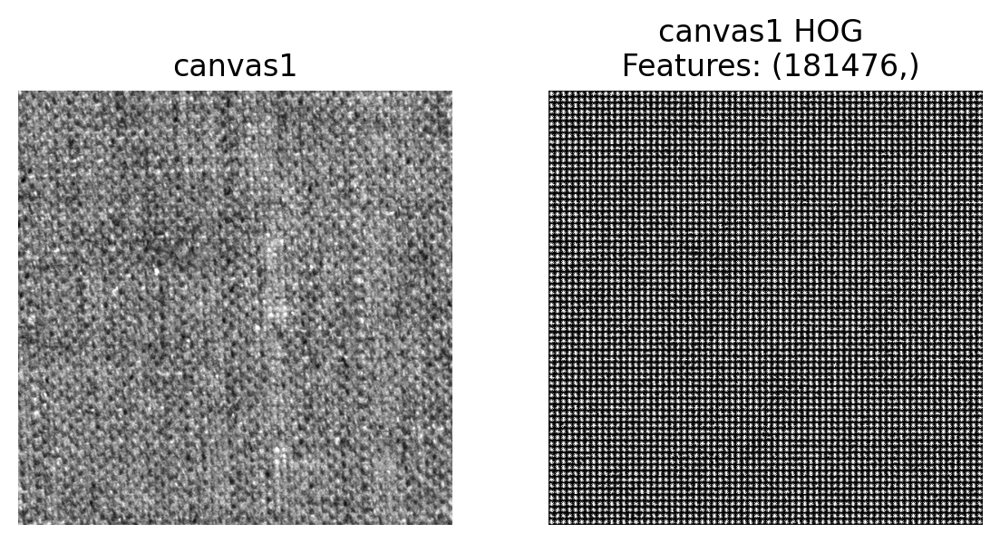

In [4]:
from descriptors.global_descriptors import histogram_of_oriented_gradients

hog_feats = histogram_of_oriented_gradients(
    sample_image,
    sample_label,
    save_folder="figures",
    file_name="HOG.png",
    plot_flag=True
)

In [5]:
print(f'Nº pixles on a image: {X_train[idx].shape[0]*X_train[idx].shape[1]}')
print(f'Nº features of an image: {hog_feats.shape[0]}')

Nº pixles on a image: 331776
Nº features of an image: 181476


### Gray Level Co-ocurrence Matrix - GLCM   

GLCM es un método estadístico utilizado para analizar las texturas de las imágenes. Este método tiene en cuenta la información espacial de la imagen y la frecuencia del par de píxeles para una cierta dirección.

Por tanto, inicialmente se debe decidir la distancia entre píxeles y la dirección. Posteriormente se obtiene la lista de pares de píxeles para la dirección y la distancia seleccionada. Luego para se obtienen los valores únicos de pares de píxeles y se obtiene su frecuencia a lo largo de la imagen para esa distancia y dirección. Y por último se sustituyen los píxeles por su frecuencia.

De este método podemos sacar una serie de características estadísticas como:
- Contraste: mide la diferencia de intensidad entre un píxel y su vecino en toda la imagen
- Disimilitud: mide  cuanto difieren los píxeles vecinos.
- Correlación: mide como de correlado está un píxel con sus vecinos.
- Energía: mide la varianza de la imagen.
- Homogeneidad: mide la similitud de los píxeles vecinos.
- ASM: mide el orden y la uniformidad de la textura.

Este método puede aplicar tanto a la imagen completa como a patches de la imagen. Un patch es una región de la imagen.

Se han creado dos funciones:
- `glcm_global` que calcula el GLCM de la imagen completa.
- `glcm_patches` que calcula el GLCM de patches de la imagen, que o bien se puede especificar en el parámetro de `patch_cords` una lista de coordenadas (x1, y1, x2, y2) para cada patch, o bien se puede decir en cuantas regiones queremos que se divida la imagen en el parámetro de `grid_size`.

Por tanto, tenemos 6 propiedades que tenemos para calcular el GLCM por cada distancia y por cada dirección.

Si se utilizan el GLCM global con 4 direcciones ($0, \pi/4, \pi/4, 3\pi/4$) y una distancia de 1, entonces tendremos como resultante un vector de $6 \cdot 1 \cdot 4 = 24$ propiedades.


Y si dividimos la imagen en 4 regiones, entonces tendremos como resultante un vector de $6 \cdot 1 \cdot 4 \cdot 4 = 96$ propiedades.

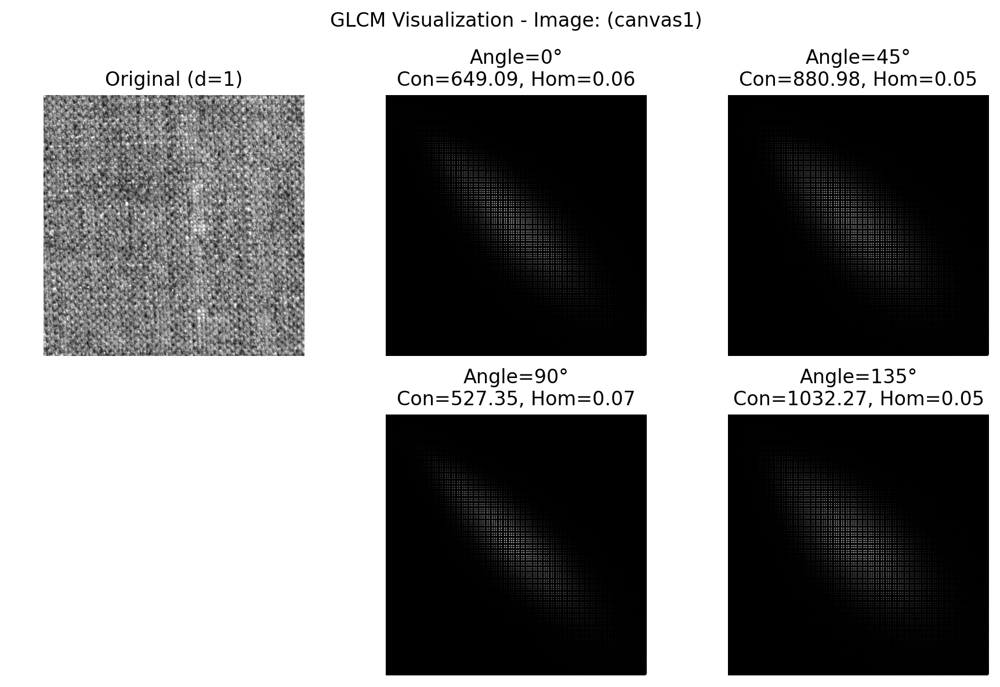

In [6]:
from descriptors.global_descriptors import glcm_global

glcm_features = glcm_global(
    sample_image,
    sample_label,
    distances = [1],
    save_folder="figures",
    file_name="GLCM.png",
    plot_flag=True
)


In [ ]:
print(f'Num features in GLCM: {glcm_features.shape[0]}')

Num features in GLCM: 24


In [ ]:
from descriptors.global_descriptors import glcm_with_patches
glcm_features_patches = glcm_with_patches(
    sample_image,
    sample_label,
    grid_size=(2,2),
    distances = [1],
    plot_flag=True
)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
print(f'Num features in GLCM con patches: {glcm_features_patches.shape[0]}')

Num features in GLCM con patches: 96


### Local Binary Pattern - LBP

LBP es un método que se emplea mucho en los problema de Vision por Computador y en los problemas de análisis de texturas. Funciona codificando la información local de la imagen comparando cada pixel con su vecinos.

LBP asigna un código binario a cada pixel empleando la comparación de un píxel con su vecinos.

En este método se siguen los siguientes pasos:
1. Conversión a escala de grises
2. Por cada píxel se obtienen todos los vecinos, que considerando el bloque de 3x3 como vecindario, el píxel objetivo es el del centro y este tendrá 8 vecinos.
3. Se comparará la intensidad de este píxel con sus vecinos, y si el vecino I es mayor que el píxel objetivo, se asigna un 1, si es menor se asigna un 0.
4. Se concatenan los 8 valores binarios en sentido horario, formando un código de 8 bits. (En el código esta preparado para que se pueda empezar a concatenar desde la esquina superior izquierda o desde la esquina superior derecha).
5. Se transforma el código binario a decimal y se susituye en la imagen.
6. Se repite el proceso para todos los píxeles de la imagen.
7. Se construye un histograma de los valores obtenidos. Como se emplean 8 bits, el histograma toma valores entre 0 y 255.
    Se decide mejorar dividir el histograma en bins en este caso depende del parámetro N_bins, y asi dividirlo en 2^N_bins bins.

Por tanto el numero total de vectores depende del numero de bins, si tenemos de 0 a 255 bits y utilizamos 2^N_bins, el numero total de vectores es 256/2^N_bins.

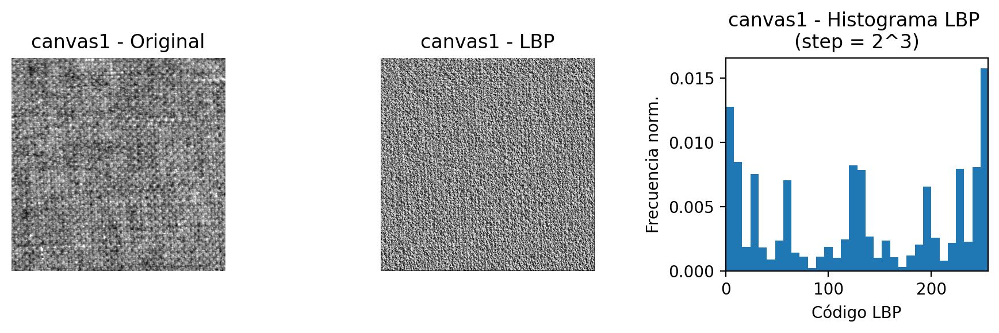

In [ ]:
from descriptors.global_descriptors import local_binary_patterns

lbp_features = local_binary_patterns(sample_image,
                                     sample_label,
                                     start_from= 'top_left',
                                     save_folder='figures',
                                     file_name='LBP.png',
                                     N_bins=3,
                                     plot_flag=True)

In [ ]:
print(f'Num features in LBP: {lbp_features.shape[0]}')

Num features in LBP: 32


El método empleado anteriormente de LBP es desarrollado con la teoría de Vision por Computador de la asignatura. Pero, creo que es un poco lento, porque hay mucho bucle. Entonces he buscado información al respecto de Skiimage, y mucho mejor, más rápido, pero las soluciones difieren un poco.

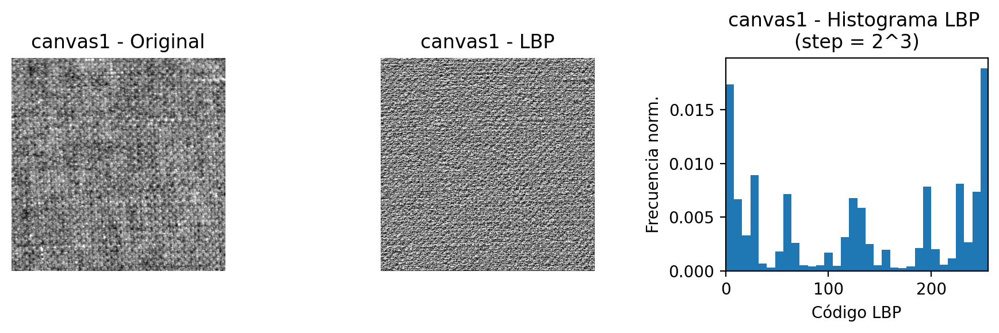

In [ ]:
from descriptors.global_descriptors import lbp_features_skimage

lbp_features = lbp_features_skimage(sample_image,
                                     sample_label,
                                     method='default',
                                     N_bins = 3,
                                     save_folder='figures',
                                     file_name='LBP_skimage',
                                     plot_flag=True)

In [ ]:
print(f'Num features in LBP: {lbp_features.shape[0]}')

Num features in LBP: 32


## 2. Análisis de los Descriptores Locales

### Harris Detector

Harris Detector es un descriptor local que se encarga de detectar las esquinas de una imagen. En este proceso son muy importantes los gradientes de la imagen, ya que una alta variación en la imagen implica que hay una esquina.

Los pasos que se siguen en este extractor de características son los siguientes:
1. **Calculo de los gradientes**: Por cada píxel en escala de grises se calculan los gradientes en las direcciones x e y, $G_x$ y $G_y$.
2. **Se construye el tensor**: por cada píxel se calcula los elementos del tensor de la estructura aplicando una función de suavizado Gaussiano sobre los gradientes al cuadrado:
$$
M = \begin{bmatrix}
    G_{xx} & G_{xy} \\
    G_{yx} & G_{yy}
\end{bmatrix}
$$
3. **Calculo de los responsables de las esquinas**: empleando la matriz $M$ se calcula el determinante y el trace para obtener  $R = \det(M) - k(\text{trace}(M))^2$.
4. **Se aplica un umbral**: se aplica un umbral para obtener los píxeles que son esquinas.
$$R>threshold \implies \text{esquina}$$


La función de identificación de esquinas R depende de los autovalores de la matriz $M$, que son $\lambda_1$ y $\lambda_2$. Y se sabe que si:
* $\lambda_1 \approx \lambda_2 \approx 0$ el pixel pertenece a "flat region", región plana.
* $\lambda_1 >>0$ y $\lambda_2 \approx 0$ el pixel pertenece a "edge", un borde (o viceversa).
* $\lambda_1>>0$ y $\lambda_2>>0$ el pixel pertenece a "corner", una esquina.


Pero Harris es más un detector de esquinas que un extractor de características, ya que no es su objetivo. Existiría la posibilidad de obtener un descriptor muy ineficiente que es epmleando la respuesta de Harris como descriptor, que se realizaría aplicando un aplanado a la respuesta de Harris, y obtendríamos un descriptor del tamaño de la imagen aplanada.

Creo que lo interesante aquí sería extraer estadísticos/resumen de Harris, por tanto se devuelve de la función, el número total de esquinas detectadas, el porcentaje de píxeles de la imagen que son esquinas, el valor máximo de la respuesta de Harris, la media y la desviación estándar de la respuesta de Harris.


In [ ]:
from descriptors.local_descriptors import harris_corner_features
hc_features = harris_corner_features(sample_image, sample_label,
                        save_folder='figures',
                        file_name='Harris.png',
                        plot_flag=True)

Output hidden; open in https://colab.research.google.com to view.

### Canny Edge Detector

Canny Edge Detector es un detector de bordes en imágenes. Este algoritmo consite en los siguientes pasos:
1. **Reducción de ruido**: Se aplica un filtro de Gauss para reducir el ruido en la imagen.
2. **Calculo de gradientes**: Se calculan los gradientes en las direcciones x e y, $G_x$ y $G_y$ y se obtiene su dirección y magnitud. La dirección del gradiente siempre es perpendicular al borde.
3. **Non-maximum suppression**: una vez se obtiene las magnitudes y direcciones de los gradientes se aplica non-maximum suppression para obtener los bordes y eliminar los píxeles que no forman parte del borde. Esto permite obtener bordes más claros y definidos.
4. **Hysteresis thresholding**: una vez se obtienen los bordes se aplica hysteresis thresholding para obtener los bordes finales.
    Para este caso se definen dos umbrales, `min_th` y `max_th`, si un pixel es mayor que `max_th` se considera un borde, si es menor que `min_th` se considera un píxel plano, y si está entre `min_th` y `max_th` se aplica la hysteresis thresholding, entonces si un "borde" tiene valores superiores a `max_th`y luego está por debajo de `max_th` se seguirá considerando como borde, por el contrario, se descartará.

In [ ]:
from descriptors.local_descriptors import canny_edge_features
hc_features = canny_edge_features(sample_image, sample_label,
                                  blur_ksize=(5,5),
                                  blur_sigma=1.5,
                                  save_folder='figures',
                                  file_name='Canny.png',
                                  plot_flag=True)

Output hidden; open in https://colab.research.google.com to view.

### Scale Invariant Feature Transform (SIFT)

SIFT extrae los puntos de interés y luego de cada uno de ellos extrae un descriptor. Este algoritmo se compone de 4 pasos:
1. **Scale space extrema detection**: este paso tiene como objetivo encontrar los keypoints de la imagen y que sen keypoints a diferentes escalas.
 - Se utiliza Laplacian of Gaussian, LOG, con diferentes valores de $\sigma$, para que SIFT sea invariante a escalas. Con LOG detectamos "blobs", los puntos de interés, que son identificados ya que son máximos o mínimos locales. Pero LOG es costoso, por lo que se utiliza una aproximación que es Difference of Gaussian,DOG.

 - DOG consiste en aplicar la diferencia entre dos Laplacianos de Gaussianos con diferentes valores de $\sigma$.

 - Una imagen se divide esta en octavas, y a cada octava se le aplica la operación de DOG para diferentes escalas. (En el paper oficial emplean 4 octavas y 5 escalas por octava, con un $\sigma$ inicial de 1.6 y $K=\sqrt{2}$).

 - Se coge un píxel de una imagen DOG y se compara con los 8 píxeles vecinos, los 9 vecinos de la escala anterior y los 9 vecinos de la escala siguiente. Si el píxel seleccionado es mayor o menor que todos los vecinos, es un keypoint.

2. **Keypoint localization**: en este paso se tiene como objetivo refinar y filtrar los keypoints. Con el primer paso se han identificado los keypoints, algunos con mayor o menor contraste que otros (aportarán más o menos información al descriptor) y habrá keypoints que esten encima de los bordes. Por tanto, se refina la ubicación de los keypoints y se eliminan los que no cumplen con el umbral de contraste. También se eliminan los keypoints que estén demasiado cerca de otros keypoints, esto se realiza utilizando la matriz Hessiana $H$ para calcular la curvatura de la imagen en el punto del keypoint y para los bordes se obtienen sus autovalores y se calcula un ratio de curvatura y se considerará keypoint si el ratio es mayor que un umbral (típicamente de 10).

3. **Orientation Assignment**: permite saber en que orientación están los keypoints, permite la invarianza a rotaciones. En este paso se selecciona un vecindario próximo al keypoint y se calcula el gradiente en cada píxel del vecindario y se calcula la dirección del gradiente. Se construye un histograma de 36 bins que cubre los 360 grados. Se selecciona el mayor píco del histograma de orientacion como keypoint y si hay valores con un 80% del valor máximo, se consideran como keypoints adicionales.

4. **Keypoint descriptor**: el objetivo es describir el vecindario y asi se es robusto a la variación de la iluminación y la rotación. Se selecciona una ventana de 16x16 píxeles alrededor del keypoint. Cada ventana se divide en 4x4  regiones (sub-bloques). En cada sub-bloque se calcula el hisograma de gradientes de 8 bins que cubre los 360 grados, por tanto un subbloque tiene un vector de 8 dimensiones. Como hay 4x4 subbloques, y cada subbloque tiene un vector de 8 dimensiones, el descriptor tiene un tamaño de 128 dimensiones, que se concatenan para formar el descriptor del keypoint.

Por tanto como resultado se obtiene una matriz de dimensiones $N_{keypoints} \times 128$

En este caso el emplear SIFT sobre un modelo de ML no tendría sentido ya que cada imágen tendrá un número diferente de keypoints, una dimensión variable.

Por lo que hay una estrategia que consiste en sacar estadísticos sobre el conjunto de los keypoints de la imagen, media o la media de la desviación estándar, o seleccionando los K mejores keypoints, el puntuaje que determina si un keypoint es el mejor es de su valor `response`. (En el caso que se seleccionen los mejores K keypoints y se tengan menos, se rellena con ceros). Para esto se ha creado una función que se llama `sift_features_1D`, permite seleccioinar una o varias de estas características de `mean`, `mean_std` o `top_k`, luego se concatenan para formar el descriptor de la imagen.

Otra estrategia para poder emplearlo como descriptor es emplear Bag of Visual Words o Vector Locally Aggregated Descriptors

In [ ]:
from descriptors.local_descriptors import sift_features, sift_features_1D

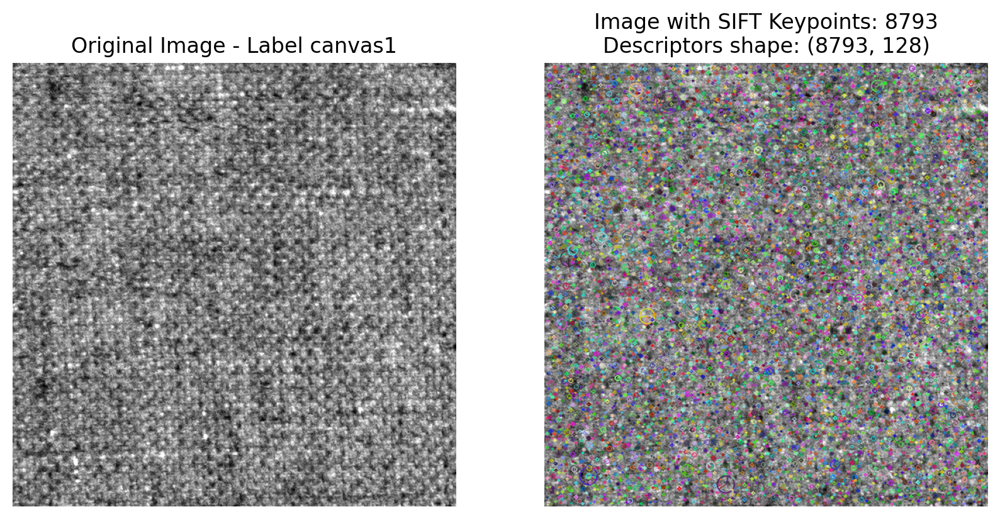

In [ ]:
keypoints, sift_feat = sift_features(
                        sample_image,
                        sample_label,
                        return_keypoints=True,
                        save_folder='figures',
                        file_name='SIFT.png',
                        plot_flag=True)

Se genera el sift_features_1D para poder incluirlo en el pipeline

In [ ]:
feat_sift_1D = sift_features_1D(
                    sample_image, sample_label,
                    strategies=('mean', 'mean_std', 'top_k'),
                    k=10)

### Bag of Visual Words (BoVW)

BoVW pretende solucionar los problemas que nos encontramos con extractores locales como SIFT o SURF, que devuelven una cantidad variable de keypoints por imagen. Este método consiste en un mapa de codificación de palabras, es decir, un diccionario de descriptores de keypoints.

Este proceso consta de tres etapas:
1. **Feature extraction**: Extraemos los descriptores de los keypoints del conjunto de imágenes de entrenamiento.
2. **Building the vocabulary**: del conjunto de keypints se crean clusters de descriptores para formar el vocabulario, **codebook**. Se puede utilizar K-means para formar el codebook.

    Para construir el K-means hay que definir el número de clusters, es decir, el tamaño del codebook. Típicamente se seleccionan las posibles etiquetas del dataset y se multiplican por un factor, típicamente de 10.
3. **Image representation**: cada imagen se representa como un histograma de las palabras que aparecen en la imagen. Por cada imagen se extraen los keypoints y se asigna a cada uno de ellos la palabra más cercana en el codebook, luego se forma un histograma de las palabras que aparecen en la imagen.

El histograma generado para las imágenes de entrenamiento se pueden utilizar como vectores de entrada para un clasificador.

Luego si queremos realizar inferencia sobre una imagen, se extraen los keypoints y se asigna a cada uno de ellos la palabra más cercana en el codebook, luego se forma un histograma de las palabras que aparecen en la imagen y se utiliza como vector de entrada para el clasificador.

In [ ]:
from descriptors.local_descriptors import sift_features_set_images, train_sift_codebook, build_bovw_dataset

In [ ]:
dico_train = sift_features_set_images(X_train)
kmeans, k, labels_unique = train_sift_codebook(dico_train, y_train)
X_train_bovw, y_train_bovw = build_bovw_dataset(
    images=X_train,
    labels=y_train,
    kmeans=kmeans,
    k=k,
    plot_N=4,
    max_cols=4,
    save_folder="figures",
    file_name="BoVW.png",
    plot_flag=True
)


In [ ]:
X_val_bovw, y_val_bovw = build_bovw_dataset(
    images=X_val,
    labels=y_val,
    kmeans=kmeans,
    k=k
)

In [ ]:
from sklearn.svm import SVC

svm = SVC(kernel='poly', C=1).fit(X_train_bovw, y_train_bovw)

In [ ]:
acc_train = svm.score(X_train_bovw, y_train_bovw)
acc_val = svm.score(X_val_bovw, y_val_bovw)
print("Train acc:", acc_train)
print("Test val:", acc_val)

### Vector of Locally Aggregated Descriptors (VLAD)

VLAD también pretende solucionar el problema de la dimensionalidad de los descriptores locales. Aquí los pasos se parecen a BOVW, pero hay diferencias:
1. **Feature extraction**: extraemos los descriptores locales con SIFT sobre el conjunto de imágenes de entrenamiento.
2. **Codebook creation**: al igual que en BOVW también emplea K-means para crear el codebook.
3. **Residual encoding**: por cada keypoint de la imagen se le asigna el código más cercano del codebook, y se calcula la residual vector como la diferencia entre el descriptor del keypoint y el descriptor del código más cercano. Se realiza para todos los keypoints de la imagen y se concatenan para formar el descriptor de la imagen.
4. **VLAD Vector Construction**: se concatenan los residual vectors de todas las imágenes.
5. **Vector normalization**: se normaliza con L2 para ser más robustos.

Luego con la matriz de descriptores VLAD se puede entrenar un clasificador.

In [ ]:
from descriptors.local_descriptors import train_sift_codebook, build_vlad_dataset

In [ ]:
dico = sift_features_set_images(X_train)

kmeans_vlad, k_vlad, labels_unique = train_sift_codebook(
    dico,
    y_train,
    factor=10,
    random_state=0
)

In [ ]:
X_train_vlad, y_train_vlad = build_vlad_dataset(X_train,
                                y_train, kmeans_vlad,
                                save_folder="figures",
                                file_name="VLAD.png",
                                plot_flag=True)
X_val_vlad, y_val_vlad = build_vlad_dataset(X_val, y_val, kmeans_vlad)

In [ ]:
X_train_vlad.shape

In [ ]:
from sklearn.svm import SVC

svm = SVC(kernel='poly', C=1).fit(X_train_vlad, y_train_vlad)

In [ ]:
acc_train = svm.score(X_train_vlad, y_train_vlad)
acc_val = svm.score(X_val_vlad, y_val_vlad)
print("Train acc:", acc_train)
print("Test val:", acc_val)

## Pipeline

En este paso va a mostrar dos funciones que se han definido para automatizar los procesos de la concatenación de extracción de descriptores. Esto nos permite juntar los diferentes descriptores y obtener un vector más amplio que mejor describa la imagen.

Se han definido dos funciones una que permite aplicar el pipeline a una imagen y otra que permite aplicar el pipeline a una lista de imágenes.

Nota: Para utilizar SIFT es necesario utilizar el de la versión 1D, ya que si no no se podrá emplear debido a que su versión normal dependerá del número de keypoints y no es estable para el conjunto completo de imágenes.

Por tanto este pipeline es válido para:
* `histogram_features`
* `glcm_global`, `glcm_with_patches`
* `local_binary_patterns`
* `harris_corner_features`
* `canny_edge_features`
* `sift_features_1D`

In [ ]:
from descriptors.feature_descriptors import feature_extraction_image


steps = [
    (histogram_of_oriented_gradients, "HOG", {
        "orientations": 9, "pixels_per_cell": (8, 8),
        "cells_per_block": (2, 2), "block_norm": "L2",
        "plot_flag": False, "save_folder": None
    }),
    (glcm_global, "GLCM global", {
        "distances": [1], "angles": [0, np.pi/4, np.pi/2, 3*np.pi/4],
        "plot_flag": False, "save_folder": None
    })]

feature_vector, feature_info = feature_extraction_image(
    img=sample_image, label=sample_label, steps=steps,
    debug=True)

## Clasificadores de descriptores con ML

Vamos a tratar de emplear la misma arquitectura de Machine Learning, un SGD y una KNN para probar los diferntes descriptores por separado y la concatenación de los mismos.


Cuando se emplee BoVW o VLAD, se aplicará el modelo de Machine Learning sobre la salida tras construir el diccionario con el algoritmo KMeans, a estos métodos no se le añadirá más descriptores.

### Clasificadores HOG

In [ ]:
from descriptors.feature_descriptors import pipeline_feature_extraction
from descriptors.global_descriptors import histogram_of_oriented_gradients
steps = [
    (histogram_of_oriented_gradients, "HOG", {
        "orientations": 9, "pixels_per_cell": (8, 8),
        "cells_per_block": (2, 2), "block_norm": "L2",
        "plot_flag": False, "save_folder": None
    })]


In [ ]:
X_train_features_vector, feature_info = pipeline_feature_extraction(
    images=X_train, labels=y_train, steps=steps,
    debug=False)

X_val_features_vector, X_val_features_info = pipeline_feature_extraction(
    X_val, y_val, steps)

Extracting features: 100%|██████████| 72/72 [00:55<00:00,  1.29it/s]


#### SGD

In [ ]:
from summary_results.eval_results import evaluate_and_plot, evaluate_and_plot_pca3
from summary_results.summary import build_experiment_row, save_experiment_summary

In [ ]:
from sklearn.linear_model import SGDClassifier

from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

name_model = 'SGD_Classifier'
parameters_model = {
    'loss': 'hinge',
    'penalty': 'l2',
    'alpha': 0.0001,
}

sgd_clf = SGDClassifier(**parameters_model)

pipeline_sgd = Pipeline([
    ('scaler', StandardScaler()),
    ('sgd_clf', sgd_clf)
]).fit(X_train_features_vector, y_train)
y_pred_val_sgd = pipeline_sgd.predict(X_val_features_vector)

Acc: 0.71
Prec: 0.75
Rec: 0.71
F1: 0.70


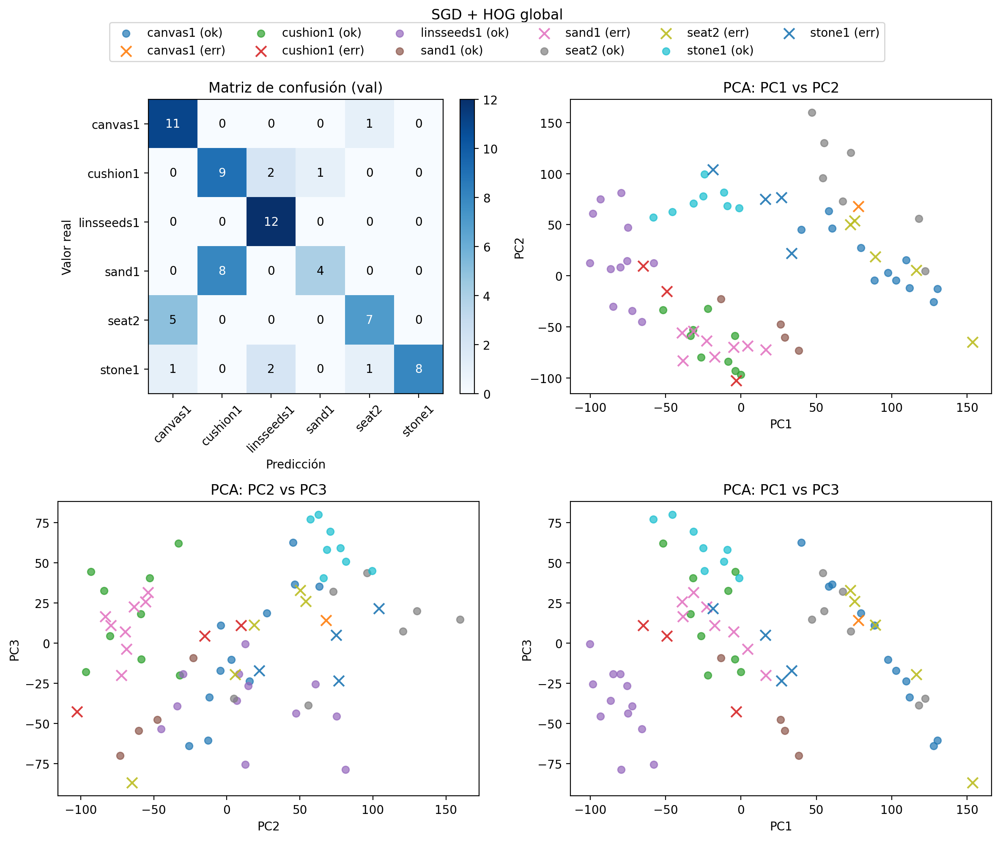

In [ ]:
metrics_val, cm_val = evaluate_and_plot_pca3(
    X_train=X_train_features_vector,
    X_val=X_val_features_vector,
    y_val=y_val,
    y_pred=y_pred_val_sgd,
    pipeline=pipeline_sgd,
    class_names=np.unique(y_val),
    fig_title="SGD + HOG global",
    save_folder="figures",
    file_name="Conf_mx_HOG_SGD.png",
    show=True,
)

In [ ]:
df_row = build_experiment_row(
    name_model=name_model,
    steps=steps,
    num_vars = X_train_features_vector[0].shape[0],
    metrics_val=metrics_val,
)

df_all = save_experiment_summary("experiments.csv", df_row)

#### KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
N_neighbors = 3
name_model = f'KNN {N_neighbors} neighbors'
knn = KNeighborsClassifier(n_neighbors=N_neighbors)
pipeline_knn= Pipeline([
    ('scaler', StandardScaler()),
    ('knn_clf', knn)
]).fit(X_train_features_vector, y_train)

pipeline_knn.fit(X_train_features_vector, y_train)
y_pred_val_knn = pipeline_knn.predict(X_val_features_vector)

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Acc: 0.17
Prec: 0.03
Rec: 0.17
F1: 0.05


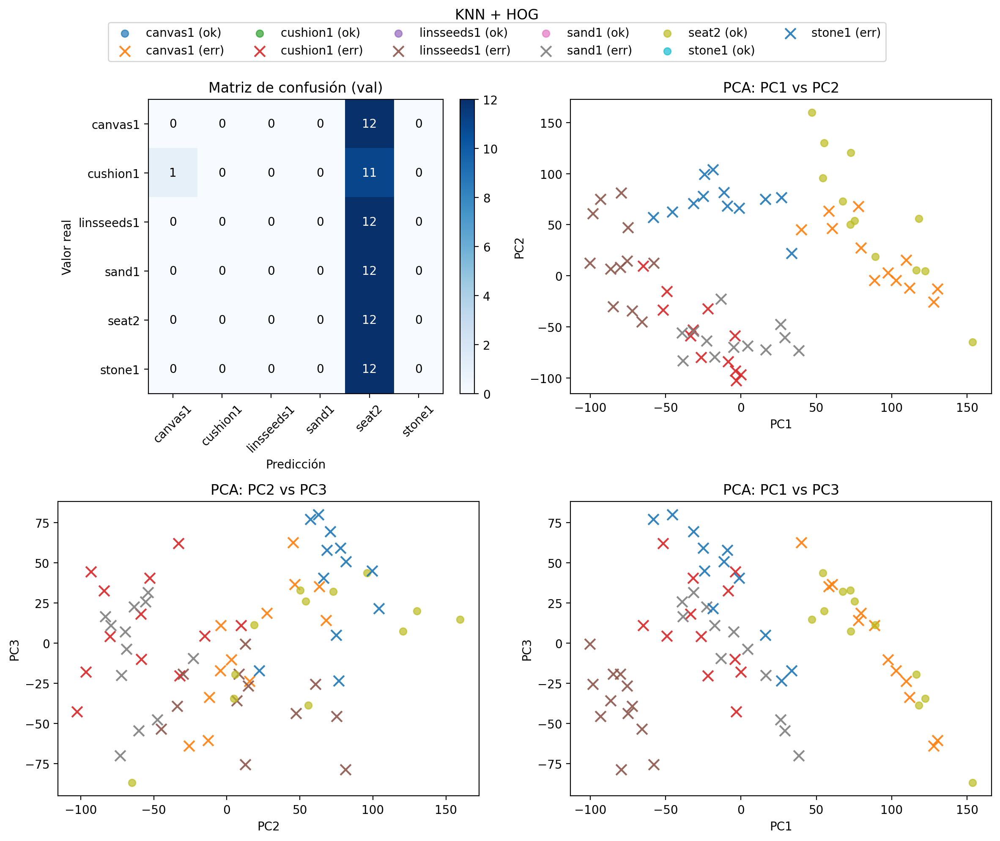

In [ ]:
metrics_val, cm_val = evaluate_and_plot_pca3(
    X_train=X_train_features_vector,
    X_val=X_val_features_vector,
    y_val=y_val,
    y_pred=y_pred_val_knn,
    pipeline=pipeline_knn,
    class_names=np.unique(y_val),
    fig_title="KNN + HOG",
    save_folder="figures",
    file_name="Cong_Mat_HOG_KNN.png",
    show=True,
)

In [ ]:
df_row = build_experiment_row(
    name_model=name_model,
    steps=steps,
    num_vars = X_train_features_vector[0].shape[0],
    metrics_val=metrics_val,
)

df_all = save_experiment_summary("experiments.csv", df_row)

### Clasificadores GLCM

In [ ]:
import numpy as np
from descriptors.feature_descriptors import pipeline_feature_extraction
from descriptors.global_descriptors import glcm_global
steps = [
    (glcm_global, "GLCM global", {
        "distances": [1], "angles": [0, np.pi/4, np.pi/2, 3*np.pi/4],
        "plot_flag": False, "save_folder": None
    })]


In [ ]:
X_train_features_vector, feature_info = pipeline_feature_extraction(
    images=X_train, labels=y_train, steps=steps,
    debug=False)
X_val_features_vector, X_val_features_info = pipeline_feature_extraction(
    X_val, y_val, steps)

Extracting features: 100%|██████████| 72/72 [00:12<00:00,  5.73it/s]


#### SGD

In [ ]:
from summary_results.eval_results import evaluate_and_plot, evaluate_and_plot_pca3
from summary_results.summary import build_experiment_row, save_experiment_summary

In [ ]:
from sklearn.linear_model import SGDClassifier

from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

name_model = 'SGD_Classifier'
parameters_model = {
    'loss': 'hinge',
    'penalty': 'l2',
    'alpha': 0.0001,
}

sgd_clf = SGDClassifier(**parameters_model)

pipeline_sgd = Pipeline([
    ('scaler', StandardScaler()),
    ('sgd_clf', sgd_clf)
]).fit(X_train_features_vector, y_train)
y_pred_val_sgd = pipeline_sgd.predict(X_val_features_vector)

Acc: 1.00
Prec: 1.00
Rec: 1.00
F1: 1.00


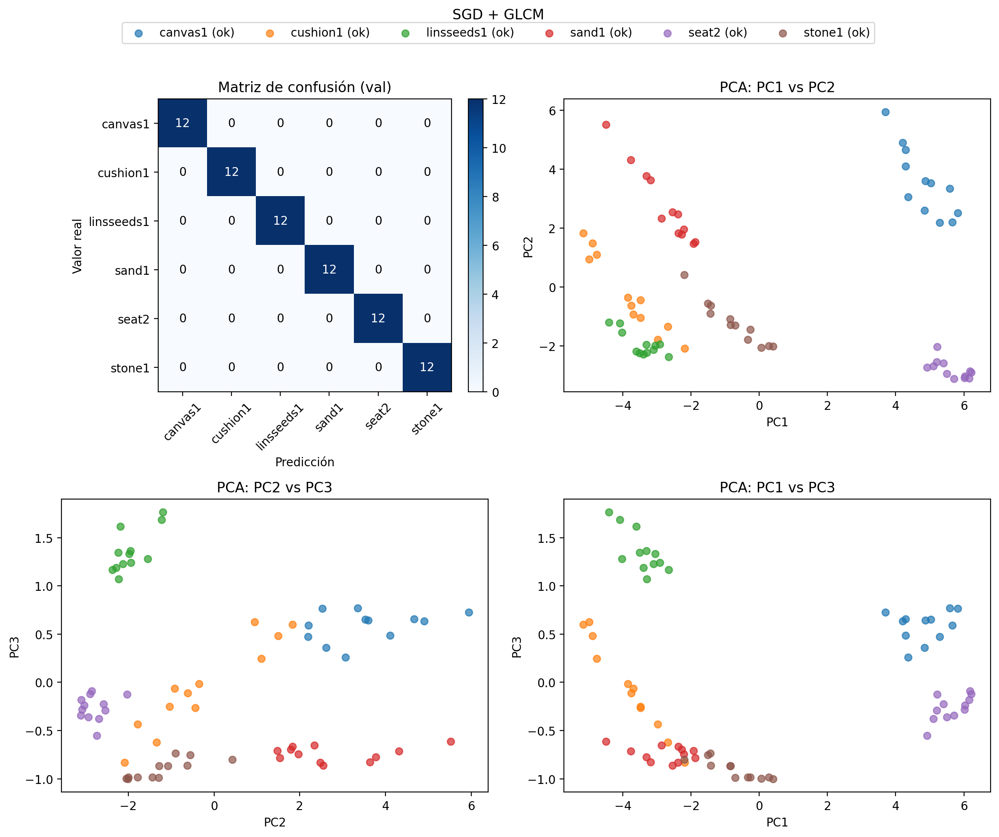

In [ ]:
metrics_val, cm_val = evaluate_and_plot_pca3(
    X_train=X_train_features_vector,
    X_val=X_val_features_vector,
    y_val=y_val,
    y_pred=y_pred_val_sgd,
    pipeline=pipeline_sgd,
    class_names=np.unique(y_val),
    fig_title="SGD + GLCM",
    save_folder="figures",
    file_name="Conf_mx_GLCM_SGD.png",
    show=True,
)

In [ ]:
df_row = build_experiment_row(
    name_model=name_model,
    steps=steps,
    num_vars = X_train_features_vector[0].shape[0],
    metrics_val=metrics_val,
)

df_all = save_experiment_summary("experiments.csv", df_row)

#### KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
N_neighbors = 3
name_model = f'KNN {N_neighbors} neighbors'
knn = KNeighborsClassifier(n_neighbors=N_neighbors)
pipeline_knn= Pipeline([
    ('scaler', StandardScaler()),
    ('knn_clf', knn)
]).fit(X_train_features_vector, y_train)

pipeline_knn.fit(X_train_features_vector, y_train)
y_pred_val_knn = pipeline_knn.predict(X_val_features_vector)

Acc: 1.00
Prec: 1.00
Rec: 1.00
F1: 1.00


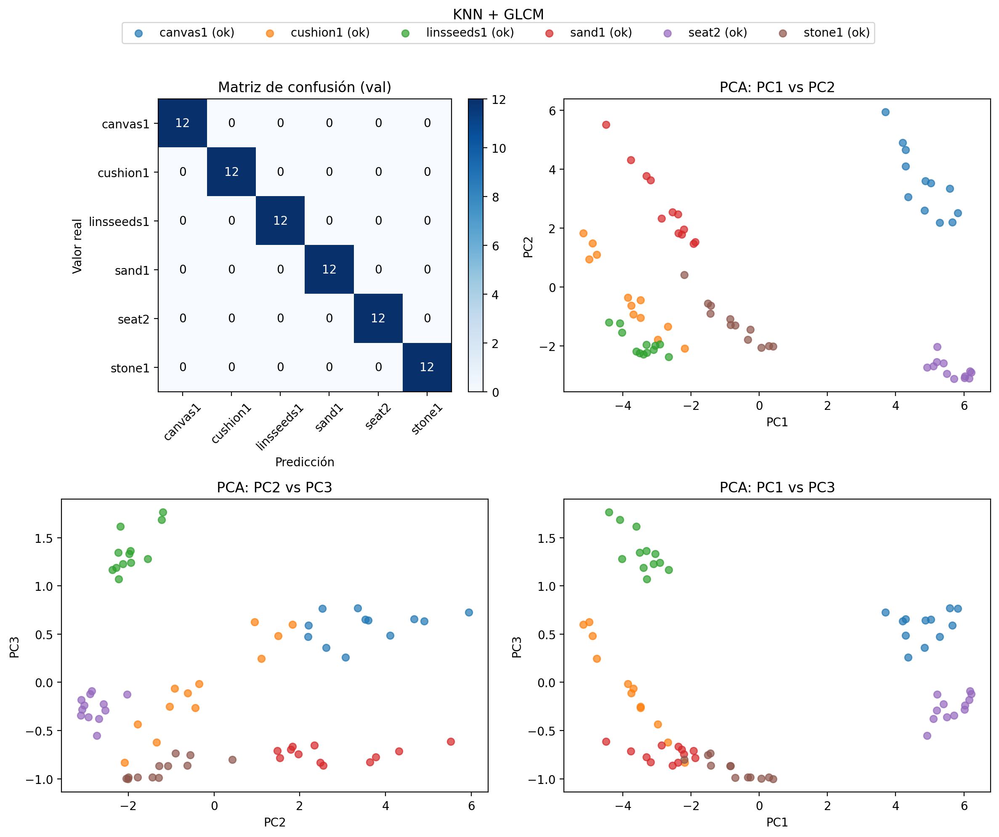

In [ ]:
metrics_val, cm_val = evaluate_and_plot_pca3(
    X_train=X_train_features_vector,
    X_val=X_val_features_vector,
    y_val=y_val,
    y_pred=y_pred_val_knn,
    pipeline=pipeline_knn,
    class_names=np.unique(y_val),
    fig_title="KNN + GLCM",
    save_folder="figures",
    file_name="Conf_mx_GLCM_KNN.png",
    show=True,
)

In [ ]:
df_row = build_experiment_row(
    name_model=name_model,
    steps=steps,
    num_vars = X_train_features_vector[0].shape[0],
    metrics_val=metrics_val,
)

df_all = save_experiment_summary("experiments.csv", df_row)

### Clasificadores LBP


In [ ]:
from descriptors.feature_descriptors import pipeline_feature_extraction
from descriptors.global_descriptors import lbp_features_skimage
steps = [(lbp_features_skimage, "LBP", {'N_bins':3})]


In [ ]:
X_train_features_vector, feature_info = pipeline_feature_extraction(
    images=X_train, labels=y_train, steps=steps,
    debug=False)
X_val_features_vector, X_val_features_info = pipeline_feature_extraction(
    X_val, y_val, steps)

Extracting features: 100%|██████████| 72/72 [00:12<00:00,  5.77it/s]


#### SGD

In [ ]:
from summary_results.eval_results import evaluate_and_plot, evaluate_and_plot_pca3
from summary_results.summary import build_experiment_row, save_experiment_summary

In [ ]:
from sklearn.linear_model import SGDClassifier

from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

name_model = 'SGD_Classifier'
parameters_model = {
    'loss': 'hinge',
    'penalty': 'l2',
    'alpha': 0.0001,
}

sgd_clf = SGDClassifier(**parameters_model)

pipeline_sgd = Pipeline([
    ('scaler', StandardScaler()),
    ('sgd_clf', sgd_clf)
]).fit(X_train_features_vector, y_train)
y_pred_val_sgd = pipeline_sgd.predict(X_val_features_vector)

Acc: 0.99
Prec: 0.99
Rec: 0.99
F1: 0.99


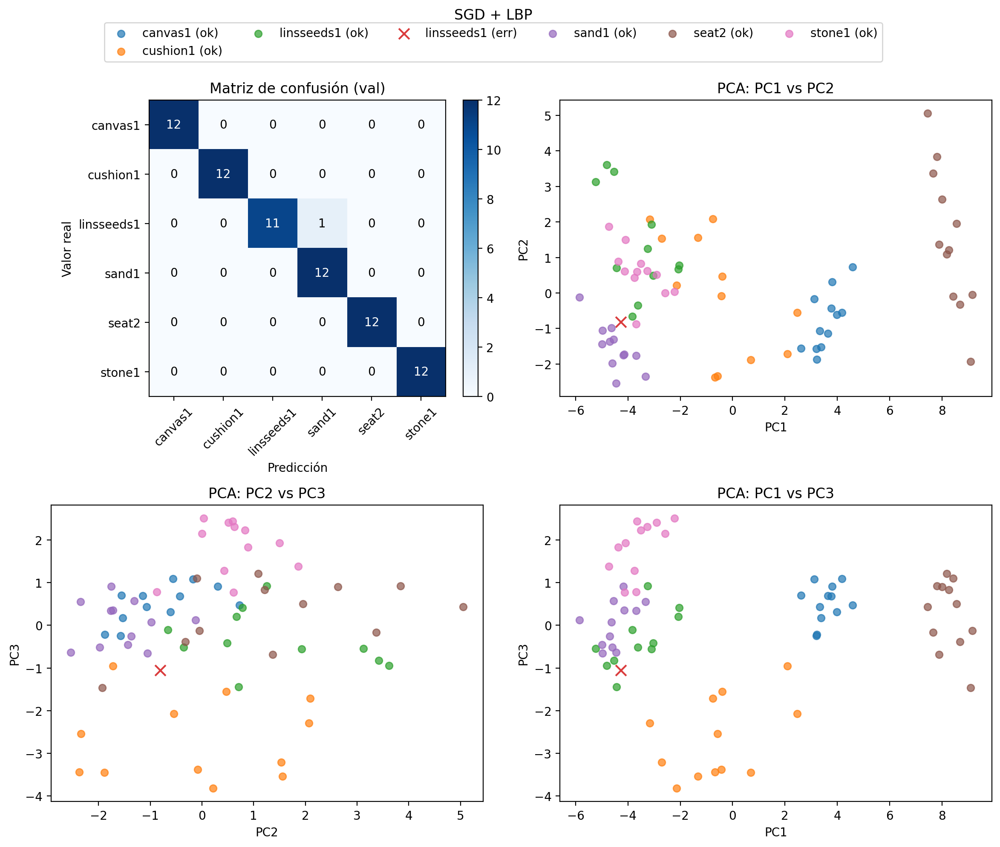

In [ ]:
metrics_val, cm_val = evaluate_and_plot_pca3(
    X_train=X_train_features_vector,
    X_val=X_val_features_vector,
    y_val=y_val,
    y_pred=y_pred_val_sgd,
    pipeline=pipeline_sgd,
    class_names=np.unique(y_val),
    fig_title="SGD + LBP",
    save_folder="figures",
    file_name="Cong_Mat_LBP_SGD.png",
    show=True,
)

In [ ]:
df_row = build_experiment_row(
    name_model=name_model,
    steps=steps,
    num_vars = X_train_features_vector[0].shape[0],
    metrics_val=metrics_val,
)

df_all = save_experiment_summary("experiments.csv", df_row)

#### KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
N_neighbors = 3
name_model = f'KNN {N_neighbors} neighbors'
knn = KNeighborsClassifier(n_neighbors=N_neighbors)
pipeline_knn= Pipeline([
    ('scaler', StandardScaler()),
    ('knn_clf', knn)
]).fit(X_train_features_vector, y_train)

pipeline_knn.fit(X_train_features_vector, y_train)
y_pred_val_knn = pipeline_knn.predict(X_val_features_vector)

Acc: 1.00
Prec: 1.00
Rec: 1.00
F1: 1.00


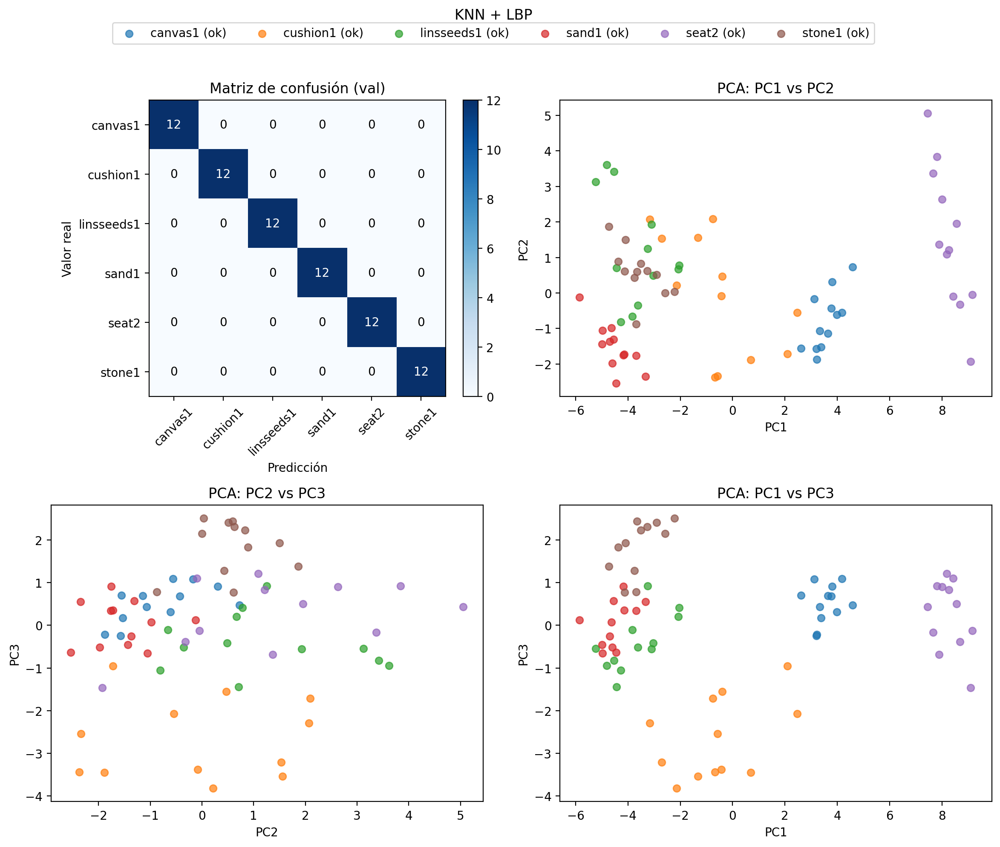

In [ ]:
metrics_val, cm_val = evaluate_and_plot_pca3(
    X_train=X_train_features_vector,
    X_val=X_val_features_vector,
    y_val=y_val,
    y_pred=y_pred_val_knn,
    pipeline=pipeline_knn,
    class_names=np.unique(y_val),
    fig_title="KNN + LBP",
    save_folder="figures",
    file_name="Conf_mx_LBP_KNN.png",
    show=True,
)

In [ ]:
df_row = build_experiment_row(
    name_model=name_model,
    steps=steps,
    num_vars = X_train_features_vector[0].shape[0],
    metrics_val=metrics_val,
)

df_all = save_experiment_summary("experiments.csv", df_row)

### Clasificador Harris

In [ ]:
from descriptors.feature_descriptors import pipeline_feature_extraction
from descriptors.local_descriptors import harris_corner_features
steps = [
    (harris_corner_features, "Harris", {})]


In [ ]:
X_train_features_vector, feature_info = pipeline_feature_extraction(
    images=X_train, labels=y_train, steps=steps,
    debug=False)
X_val_features_vector, X_val_features_info = pipeline_feature_extraction(
    X_val, y_val, steps)

Extracting features: 100%|██████████| 72/72 [00:00<00:00, 260.18it/s]


#### SGD

In [ ]:
from summary_results.eval_results import evaluate_and_plot, evaluate_and_plot_pca3
from summary_results.summary import build_experiment_row, save_experiment_summary

In [ ]:
from sklearn.linear_model import SGDClassifier

from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

name_model = 'SGD_Classifier'
parameters_model = {
    'loss': 'hinge',
    'penalty': 'l2',
    'alpha': 0.0001,
}

sgd_clf = SGDClassifier(**parameters_model)

pipeline_sgd = Pipeline([
    ('scaler', StandardScaler()),
    ('sgd_clf', sgd_clf)
]).fit(X_train_features_vector, y_train)
y_pred_val_sgd = pipeline_sgd.predict(X_val_features_vector)

Acc: 0.96
Prec: 0.96
Rec: 0.96
F1: 0.96


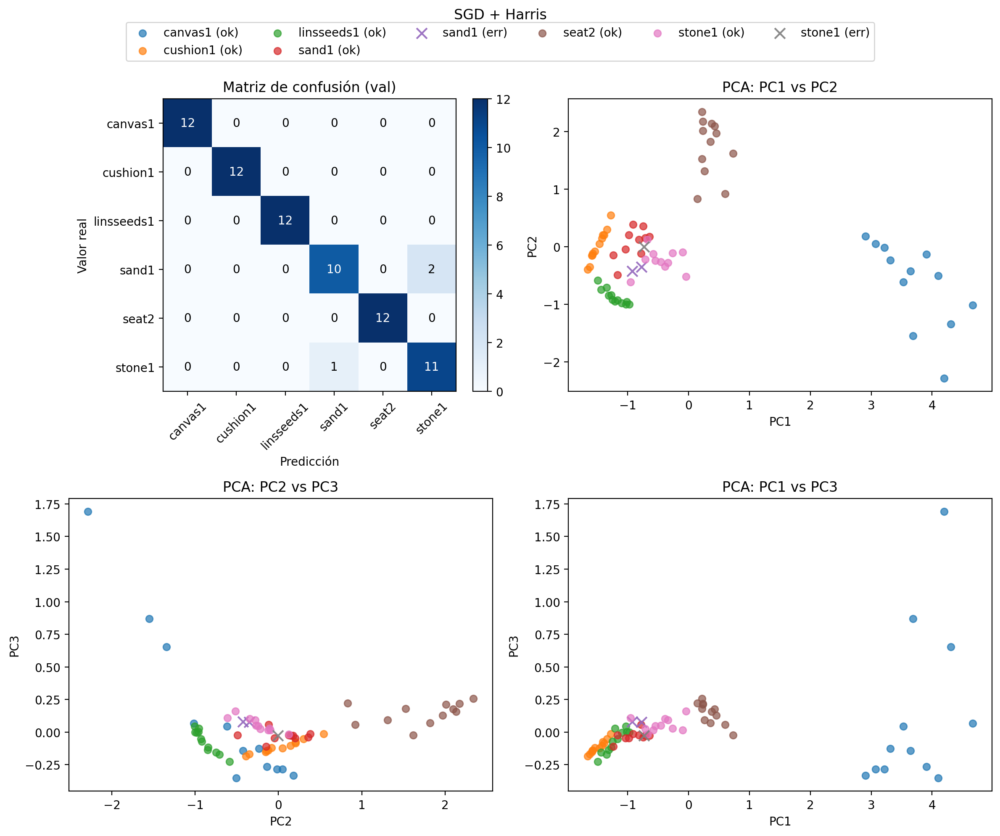

In [ ]:
metrics_val, cm_val = evaluate_and_plot_pca3(
    X_train=X_train_features_vector,
    X_val=X_val_features_vector,
    y_val=y_val,
    y_pred=y_pred_val_sgd,
    pipeline=pipeline_sgd,
    class_names=np.unique(y_val),
    fig_title="SGD + Harris",
    save_folder="figures",
    file_name="Conf_mx_Harris_SGD.png",
    show=True,
)

In [ ]:
df_row = build_experiment_row(
    name_model=name_model,
    steps=steps,
    num_vars = X_train_features_vector[0].shape[0],
    metrics_val=metrics_val,
)

df_all = save_experiment_summary("experiments.csv", df_row)

#### KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
N_neighbors = 3
name_model = f'KNN {N_neighbors} neighbors'
knn = KNeighborsClassifier(n_neighbors=N_neighbors)
pipeline_knn= Pipeline([
    ('scaler', StandardScaler()),
    ('knn_clf', knn)
]).fit(X_train_features_vector, y_train)

pipeline_knn.fit(X_train_features_vector, y_train)
y_pred_val_knn = pipeline_knn.predict(X_val_features_vector)

Acc: 0.96
Prec: 0.96
Rec: 0.96
F1: 0.96


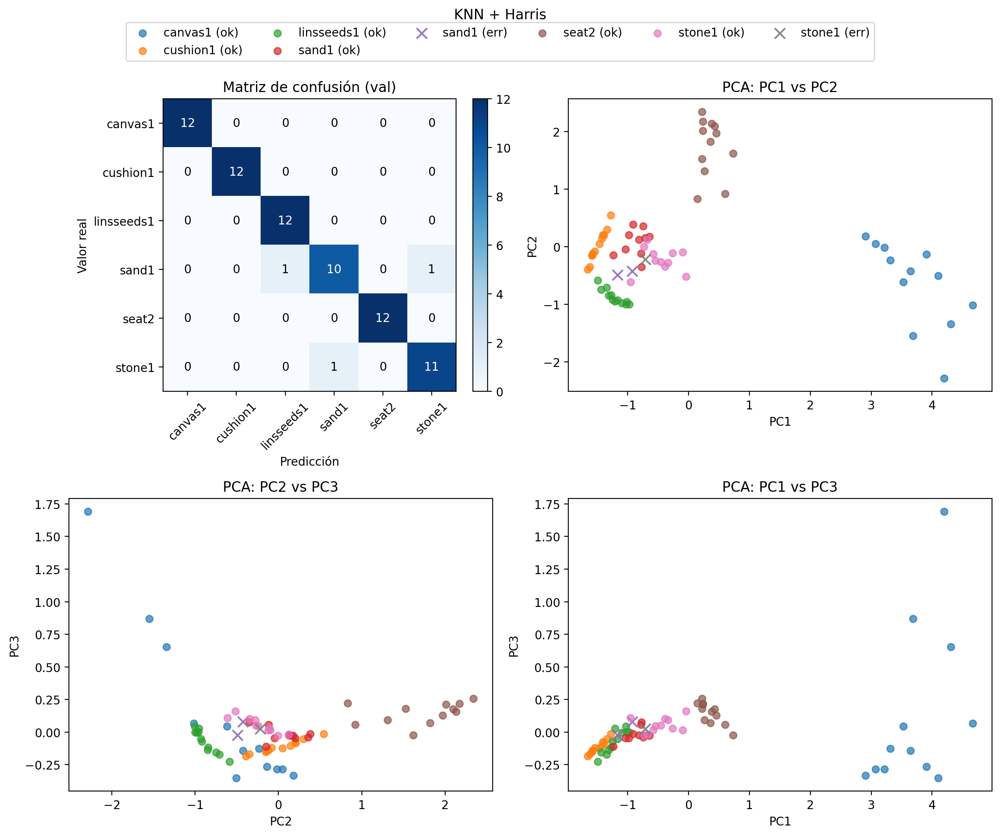

In [ ]:
metrics_val, cm_val = evaluate_and_plot_pca3(
    X_train=X_train_features_vector,
    X_val=X_val_features_vector,
    y_val=y_val,
    y_pred=y_pred_val_knn,
    pipeline=pipeline_knn,
    class_names=np.unique(y_val),
    fig_title="KNN + Harris",
    save_folder="figures",
    file_name="Conf_mx_Harris_KNN.png",
    show=True,
)

In [ ]:
df_row = build_experiment_row(
    name_model=name_model,
    steps=steps,
    num_vars = X_train_features_vector[0].shape[0],
    metrics_val=metrics_val,
)

df_all = save_experiment_summary("experiments.csv", df_row)

### Clasificador Canny

In [ ]:
from descriptors.feature_descriptors import pipeline_feature_extraction
from descriptors.local_descriptors import canny_edge_features
steps = [
    (canny_edge_features, "Canny", {})]


In [ ]:
X_train_features_vector, feature_info = pipeline_feature_extraction(
    images=X_train, labels=y_train, steps=steps,
    debug=False)
X_val_features_vector, X_val_features_info = pipeline_feature_extraction(
    X_val, y_val, steps)

Extracting features: 100%|██████████| 72/72 [00:00<00:00, 208.56it/s]


#### SGD

In [ ]:
from sklearn.linear_model import SGDClassifier

from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

name_model = 'SGD_Classifier'
parameters_model = {
    'loss': 'hinge',
    'penalty': 'l2',
    'alpha': 0.0001,
}

sgd_clf = SGDClassifier(**parameters_model)

pipeline_sgd = Pipeline([
    ('scaler', StandardScaler()),
    ('sgd_clf', sgd_clf)
]).fit(X_train_features_vector, y_train)
y_pred_val_sgd = pipeline_sgd.predict(X_val_features_vector)

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Acc: 0.64
Prec: 0.57
Rec: 0.64
F1: 0.57


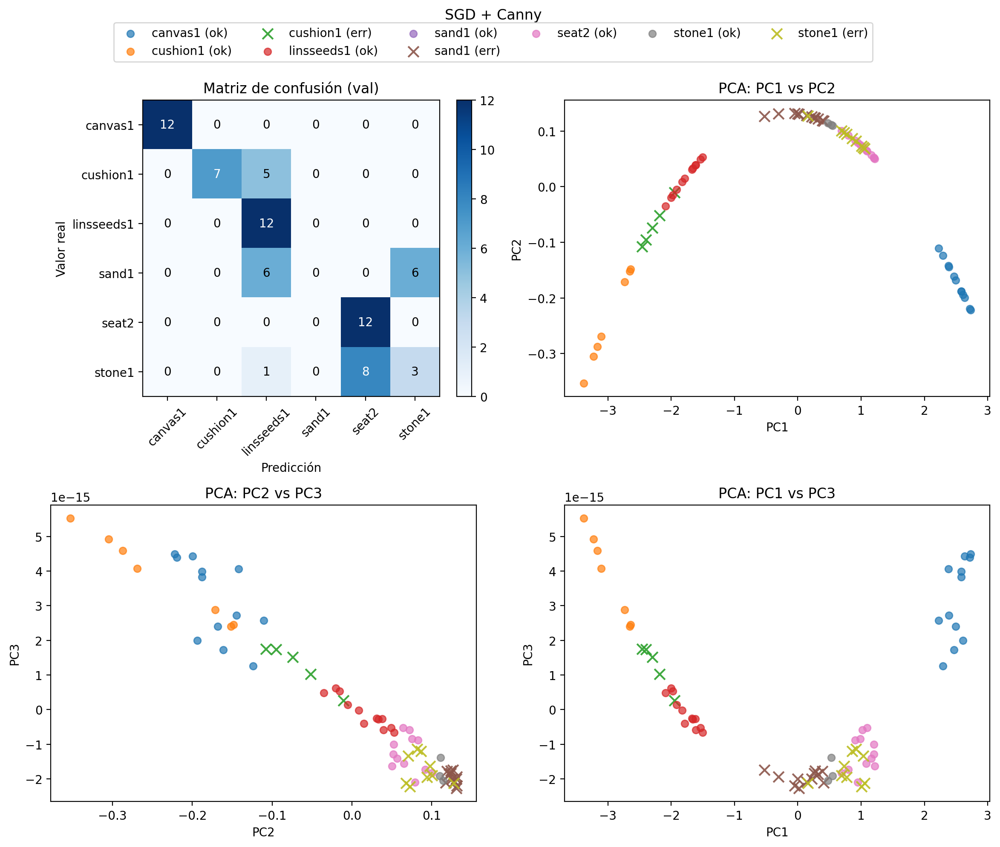

In [ ]:
metrics_val, cm_val = evaluate_and_plot_pca3(
    X_train=X_train_features_vector,
    X_val=X_val_features_vector,
    y_val=y_val,
    y_pred=y_pred_val_sgd,
    pipeline=pipeline_sgd,
    class_names=np.unique(y_val),
    fig_title="SGD + Canny",
    save_folder="figures",
    file_name="Conf_mx_Canny_SGD.png",
    show=True,
)

In [ ]:
df_row = build_experiment_row(
    name_model=name_model,
    steps=steps,
    num_vars = X_train_features_vector[0].shape[0],
    metrics_val=metrics_val,
)

df_all = save_experiment_summary("experiments.csv", df_row)

#### KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
N_neighbors = 3
name_model = f'KNN {N_neighbors} neighbors'
knn = KNeighborsClassifier(n_neighbors=N_neighbors)
pipeline_knn= Pipeline([
    ('scaler', StandardScaler()),
    ('knn_clf', knn)
]).fit(X_train_features_vector, y_train)

pipeline_knn.fit(X_train_features_vector, y_train)
y_pred_val_knn = pipeline_knn.predict(X_val_features_vector)

Acc: 0.78
Prec: 0.77
Rec: 0.78
F1: 0.77


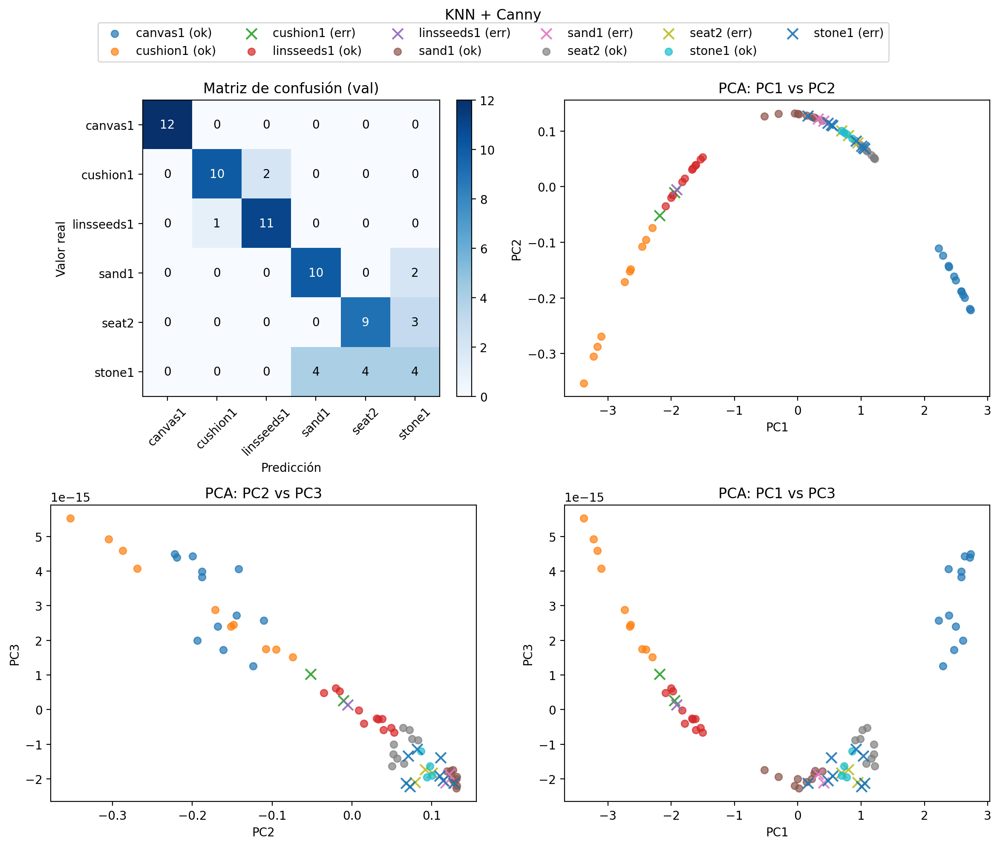

In [ ]:
metrics_val, cm_val = evaluate_and_plot_pca3(
    X_train=X_train_features_vector,
    X_val=X_val_features_vector,
    y_val=y_val,
    y_pred=y_pred_val_knn,
    pipeline=pipeline_knn,
    class_names=np.unique(y_val),
    fig_title="KNN + Canny",
    save_folder="figures",
    file_name="Conf_mx_Canny_KNN.png",
    show=True,
)

In [ ]:
df_row = build_experiment_row(
    name_model=name_model,
    steps=steps,
    num_vars = X_train_features_vector[0].shape[0],
    metrics_val=metrics_val,
)

df_all = save_experiment_summary("experiments.csv", df_row)

### Clasificador SIFT 1D

In [ ]:
from descriptors.feature_descriptors import pipeline_feature_extraction
from descriptors.local_descriptors import sift_features_1D
steps = [
    (sift_features_1D, "SIFT 1D", {})]


In [ ]:
X_train_features_vector, feature_info = pipeline_feature_extraction(
    images=X_train, labels=y_train, steps=steps,
    debug=False)
X_val_features_vector, X_val_features_info = pipeline_feature_extraction(
    X_val, y_val, steps)

Extracting features: 100%|██████████| 72/72 [00:18<00:00,  3.81it/s]


#### SGD

In [ ]:
from sklearn.linear_model import SGDClassifier

from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

name_model = 'SGD_Classifier'
parameters_model = {
    'loss': 'hinge',
    'penalty': 'l2',
    'alpha': 0.0001,
}

sgd_clf = SGDClassifier(**parameters_model)

pipeline_sgd = Pipeline([
    ('scaler', StandardScaler()),
    ('sgd_clf', sgd_clf)
]).fit(X_train_features_vector, y_train)
y_pred_val_sgd = pipeline_sgd.predict(X_val_features_vector)

Acc: 1.00
Prec: 1.00
Rec: 1.00
F1: 1.00


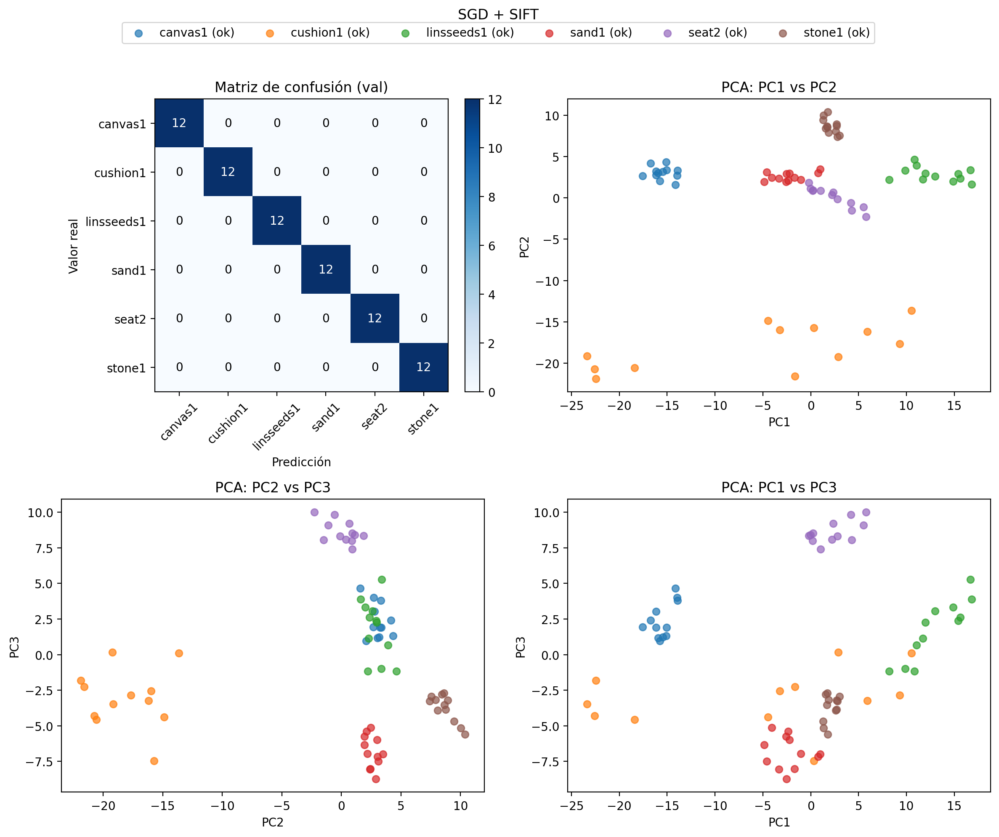

In [ ]:
metrics_val, cm_val = evaluate_and_plot_pca3(
    X_train=X_train_features_vector,
    X_val=X_val_features_vector,
    y_val=y_val,
    y_pred=y_pred_val_sgd,
    pipeline=pipeline_sgd,
    class_names=np.unique(y_val),
    fig_title="SGD + SIFT",
    save_folder="figures",
    file_name="Conf_mx_SIFT_SGD.png",
    show=True,
)

In [ ]:
df_row = build_experiment_row(
    name_model=name_model,
    steps=steps,
    num_vars = X_train_features_vector[0].shape[0],
    metrics_val=metrics_val,
)

df_all = save_experiment_summary("experiments.csv", df_row)

#### KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
N_neighbors = 3
name_model = f'KNN {N_neighbors} neighbors'
knn = KNeighborsClassifier(n_neighbors=N_neighbors)
pipeline_knn= Pipeline([
    ('scaler', StandardScaler()),
    ('knn_clf', knn)
]).fit(X_train_features_vector, y_train)

pipeline_knn.fit(X_train_features_vector, y_train)
y_pred_val_knn = pipeline_knn.predict(X_val_features_vector)

Acc: 1.00
Prec: 1.00
Rec: 1.00
F1: 1.00


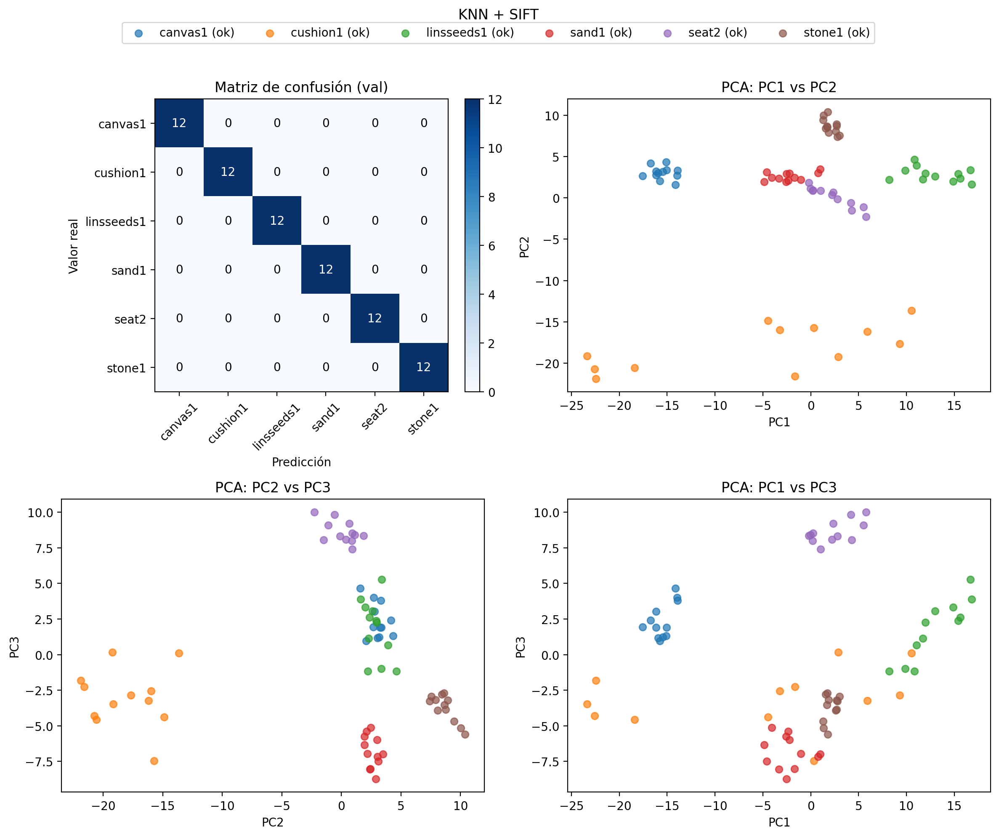

In [ ]:
metrics_val, cm_val = evaluate_and_plot_pca3(
    X_train=X_train_features_vector,
    X_val=X_val_features_vector,
    y_val=y_val,
    y_pred=y_pred_val_knn,
    pipeline=pipeline_knn,
    class_names=np.unique(y_val),
    fig_title="KNN + SIFT",
    save_folder="figures",
    file_name="Conf_mx_SIFT:KNN.png",
    show=True,
)

In [ ]:
df_row = build_experiment_row(
    name_model=name_model,
    steps=steps,
    num_vars = X_train_features_vector[0].shape[0],
    metrics_val=metrics_val,
)

df_all = save_experiment_summary("experiments.csv", df_row)

### Clasificador BoVW

Building BoVW dataset: 100%|██████████| 168/168 [00:47<00:00,  3.56it/s]


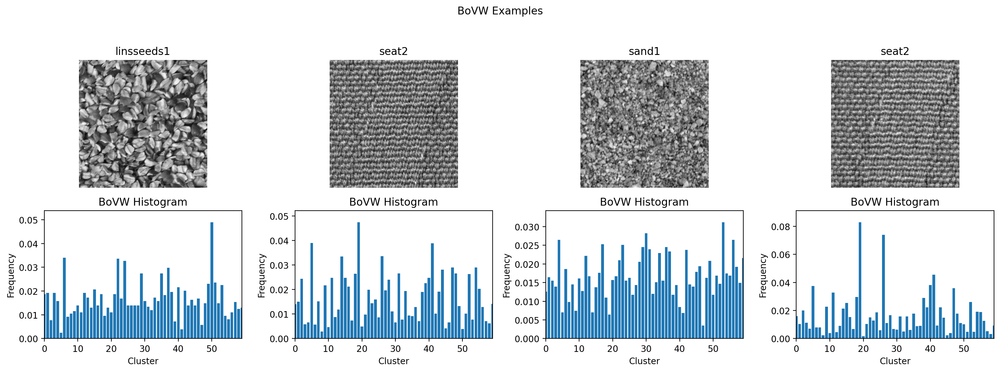

Building BoVW dataset: 100%|██████████| 72/72 [00:19<00:00,  3.68it/s]


In [ ]:
from descriptors.local_descriptors import sift_features_set_images, train_sift_codebook, build_bovw_dataset
dico_train = sift_features_set_images(X_train)
kmeans, k, labels_unique = train_sift_codebook(dico_train, y_train)
X_train_bovw, y_train_bovw = build_bovw_dataset(
    images=X_train,
    labels=y_train,
    kmeans=kmeans,
    k=k,
    plot_N=4,
    max_cols=4,
    save_folder="plots_bovw_train",
    plot_flag=True
)


X_val_bovw, y_val_bovw = build_bovw_dataset(
    images=X_val,
    labels=y_val,
    kmeans=kmeans,
    k=k
)

#### SGD

In [ ]:
from sklearn.linear_model import SGDClassifier

from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

name_model = 'SGD_Classifier'
parameters_model = {
    'loss': 'hinge',
    'penalty': 'l2',
    'alpha': 0.0001,
}

sgd_clf = SGDClassifier(**parameters_model)

pipeline_sgd = Pipeline([
    ('scaler', StandardScaler()),
    ('sgd_clf', sgd_clf)
]).fit(X_train_bovw, y_train)
y_pred_val_sgd = pipeline_sgd.predict(X_val_bovw)

Acc: 1.00
Prec: 1.00
Rec: 1.00
F1: 1.00


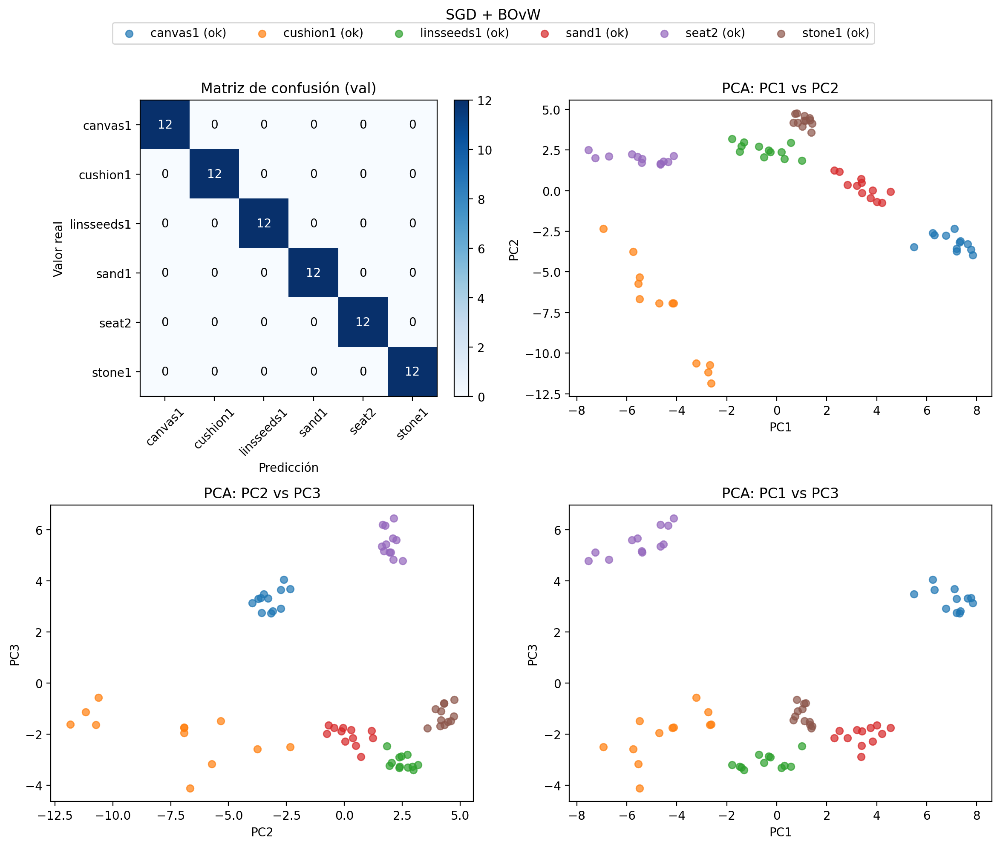

In [ ]:
metrics_val, cm_val = evaluate_and_plot_pca3(
    X_train=X_train_bovw,
    X_val=X_val_bovw,
    y_val=y_val,
    y_pred=y_pred_val_sgd,
    pipeline=pipeline_sgd,
    class_names=np.unique(y_val),
    fig_title="SGD + BOvW",
    save_folder="figures",
    file_name="Conf_mx_BoVW_SGD.png",
    show=True,
)

In [ ]:
df_row = build_experiment_row(
    name_model=name_model,
    steps=None,
    process_name = 'SIFT + BoVW',
    num_vars = X_train_bovw.shape[1],
    metrics_val=metrics_val,
)

df_all = save_experiment_summary("experiments.csv", df_row)

#### KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
N_neighbors = 3
name_model = f'KNN {N_neighbors} neighbors'
knn = KNeighborsClassifier(n_neighbors=N_neighbors)
pipeline_knn= Pipeline([
    ('scaler', StandardScaler()),
    ('knn_clf', knn)
]).fit(X_train_bovw, y_train)

pipeline_knn.fit(X_train_bovw, y_train)
y_pred_val_knn = pipeline_knn.predict(X_val_bovw)

Acc: 1.00
Prec: 1.00
Rec: 1.00
F1: 1.00


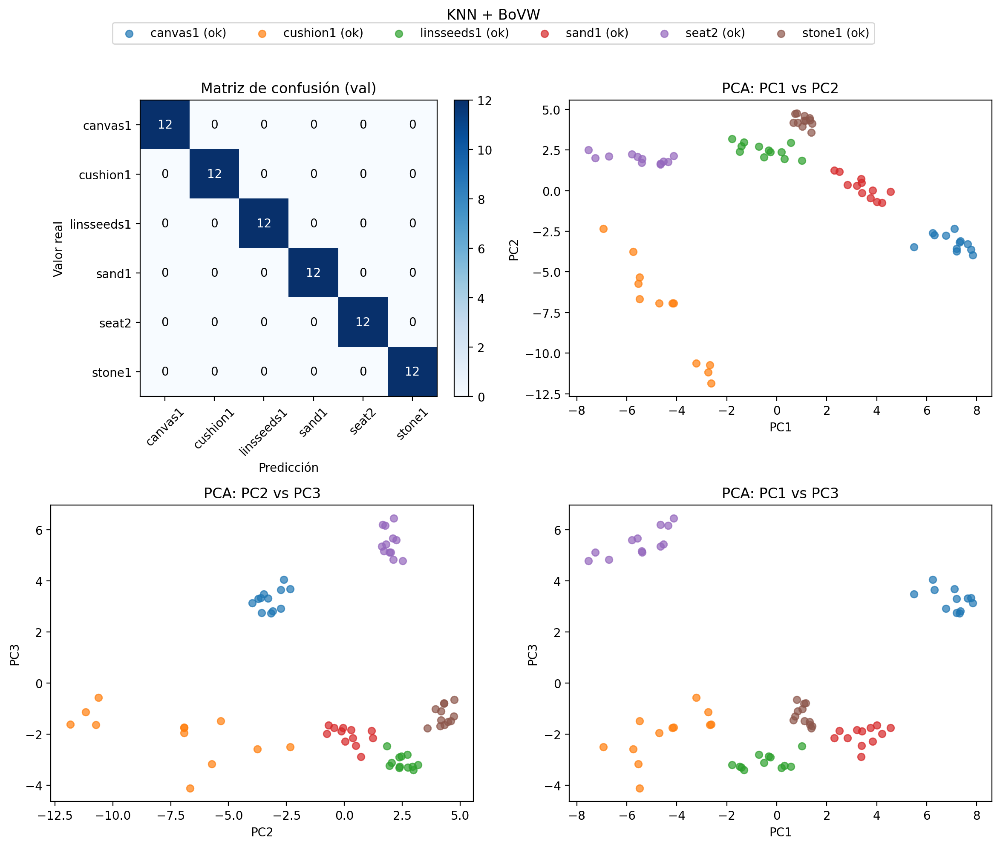

In [ ]:
metrics_val, cm_val = evaluate_and_plot_pca3(
    X_train=X_train_bovw,
    X_val=X_val_bovw,
    y_val=y_val,
    y_pred=y_pred_val_knn,
    pipeline=pipeline_knn,
    class_names=np.unique(y_val),
    fig_title="KNN + BoVW",
    save_folder="figures",
    file_name="Conf_mx_BoVW_KNN.png",
    show=True,
)

In [ ]:
df_row = build_experiment_row(
    name_model=name_model,
    steps=None,
    process_name = 'SIFT + BoVW',
    num_vars = X_train_bovw.shape[1],
    metrics_val=metrics_val,
)


df_all = save_experiment_summary("experiments.csv", df_row)

### Clasificador VLAD

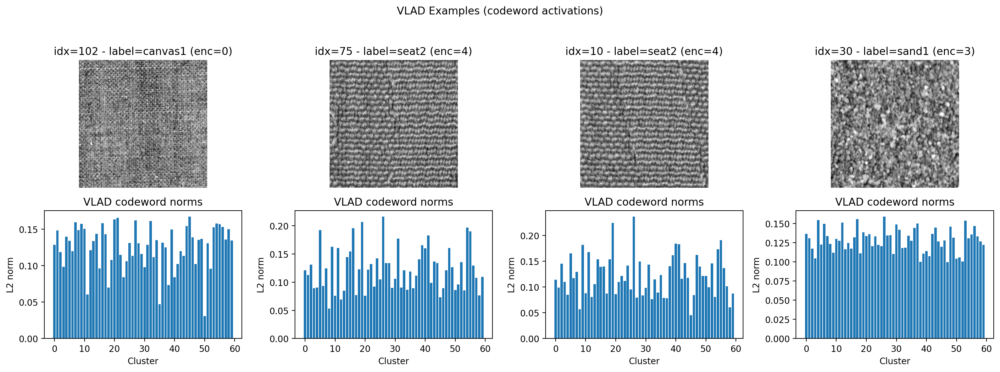

In [ ]:
from descriptors.local_descriptors import train_sift_codebook, build_vlad_dataset
dico = sift_features_set_images(X_train)

kmeans_vlad, k_vlad, labels_unique = train_sift_codebook(
    dico,
    y_train,
    factor=10,
    random_state=0
)

X_train_vlad, y_train_vlad = build_vlad_dataset(X_train,
                                y_train, kmeans_vlad,
                                plot_flag=True)
X_val_vlad, y_val_vlad = build_vlad_dataset(X_val, y_val, kmeans_vlad)

#### SGD

In [ ]:
from sklearn.linear_model import SGDClassifier

from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

name_model = 'SGD_Classifier'
parameters_model = {
    'loss': 'hinge',
    'penalty': 'l2',
    'alpha': 0.0001,
}

sgd_clf = SGDClassifier(**parameters_model)

pipeline_sgd = Pipeline([
    ('scaler', StandardScaler()),
    ('sgd_clf', sgd_clf)
]).fit(X_train_bovw, y_train)
y_pred_val_sgd = pipeline_sgd.predict(X_val_bovw)

Acc: 1.00
Prec: 1.00
Rec: 1.00
F1: 1.00


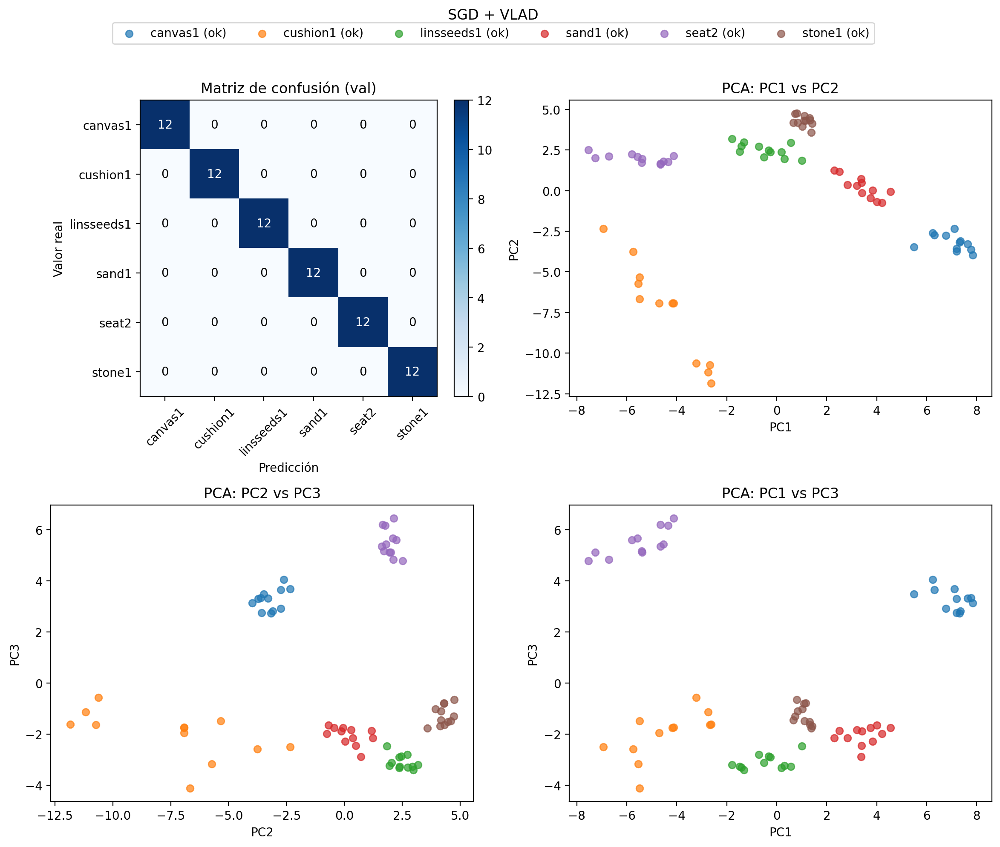

In [ ]:
metrics_val, cm_val = evaluate_and_plot_pca3(
    X_train=X_train_bovw,
    X_val=X_val_bovw,
    y_val=y_val,
    y_pred=y_pred_val_sgd,
    pipeline=pipeline_sgd,
    class_names=np.unique(y_val),
    fig_title="SGD + VLAD",
    save_folder="figures",
    file_name="Conf_mx_VLAD_SGD.png",
    show=True,
)

In [ ]:
df_row = build_experiment_row(
    name_model=name_model,
    steps=None,
    process_name = 'SIFT + VLAD',
    num_vars = X_train_bovw.shape[1],
    metrics_val=metrics_val,
)


df_all = save_experiment_summary("experiments.csv", df_row)

#### KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
N_neighbors = 3
name_model = f'KNN {N_neighbors} neighbors'
knn = KNeighborsClassifier(n_neighbors=N_neighbors)
pipeline_knn= Pipeline([
    ('scaler', StandardScaler()),
    ('knn_clf', knn)
]).fit(X_train_bovw, y_train)

pipeline_knn.fit(X_train_bovw, y_train)
y_pred_val_knn = pipeline_knn.predict(X_val_bovw)

Acc: 1.00
Prec: 1.00
Rec: 1.00
F1: 1.00


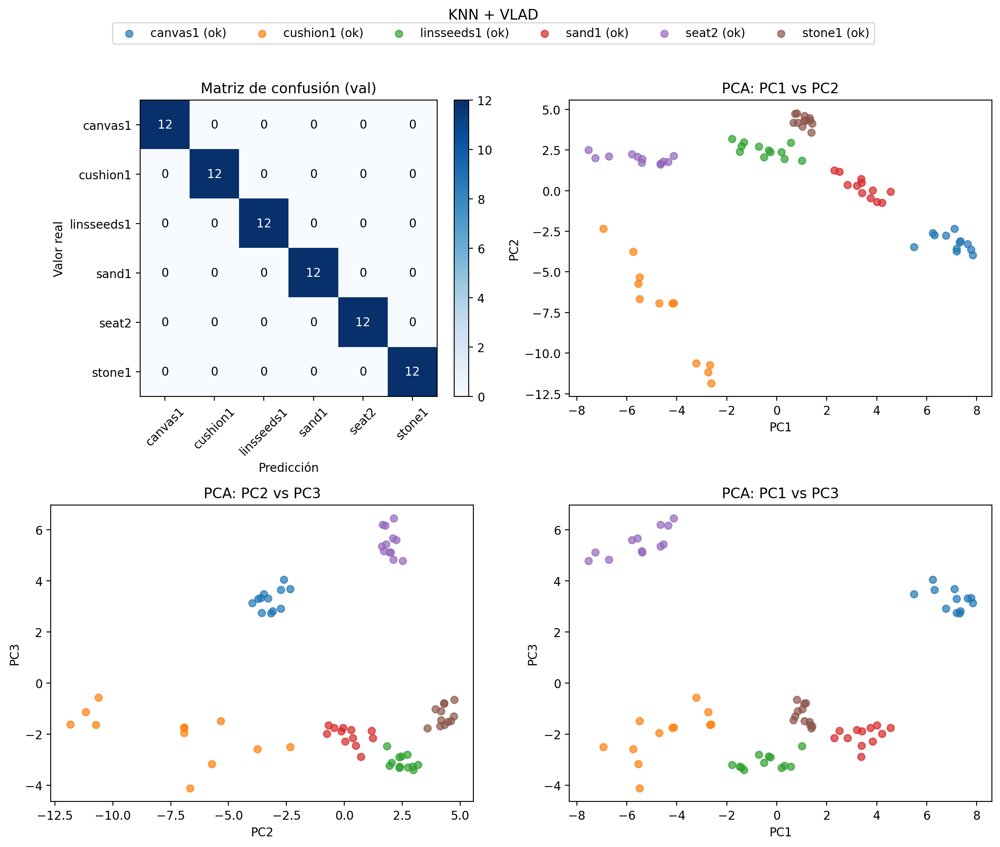

In [ ]:
metrics_val, cm_val = evaluate_and_plot_pca3(
    X_train=X_train_bovw,
    X_val=X_val_bovw,
    y_val=y_val,
    y_pred=y_pred_val_knn,
    pipeline=pipeline_knn,
    class_names=np.unique(y_val),
    fig_title="KNN + VLAD",
    save_folder="figures",
    file_name="Conf_mx_VLAD_KNN.png",
    show=True,
)

In [ ]:
df_row = build_experiment_row(
    name_model=name_model,
    steps=None,
    process_name = 'SIFT + VLAD',
    num_vars = X_train_bovw.shape[1],
    metrics_val=metrics_val,
)


df_all = save_experiment_summary("experiments.csv", df_row)

## Classification with FC

El siguiente paso fue repetir el mismo proceso de clasificación pero con un clasificador de redes neuronales, en concreto una red neuronal convolucional.

In [ ]:
from dataset_loader.loader import load_split_data
import cv2

X_train, y_train, X_val, y_val, X_test, y_test = load_split_data(
    cv2.IMREAD_GRAYSCALE,
    flag_summary=True,
    train_ratio=0.8,
    val_ratio=0.1,
    balanced_labels=True
)


Has all the images same size? Yes
The size of all the images is: (576, 576)

Number of images per class:
  seat2: 40 images
  stone1: 40 images
  canvas1: 40 images
  cushion1: 40 images
  linsseeds1: 40 images
  sand1: 40 images
Number of train images: 192
  - canvas1: 32 images
  - cushion1: 32 images
  - linsseeds1: 32 images
  - sand1: 32 images
  - seat2: 32 images
  - stone1: 32 images

Number of validation images: 24
  - canvas1: 4 images
  - cushion1: 4 images
  - linsseeds1: 4 images
  - sand1: 4 images
  - seat2: 4 images
  - stone1: 4 images

Number of test images: 24
  - canvas1: 4 images
  - cushion1: 4 images
  - linsseeds1: 4 images
  - sand1: 4 images
  - seat2: 4 images
  - stone1: 4 images


In [ ]:
import numpy as np
import cv2

# Asegurarnos de que son np.array
X_train = np.array(X_train)
X_val   = np.array(X_val)
X_test  = np.array(X_test)
class_names = np.unique(y_train)

resize_size = (256,256)
X_train = np.array([cv2.resize(img, resize_size) for img in X_train])
X_val   = np.array([cv2.resize(img, resize_size) for img in X_val])
X_test  = np.array([cv2.resize(img, resize_size) for img in X_test])

# Normalize [0,1]
X_train = X_train.astype("float32") / 255.0
X_val   = X_val.astype("float32")   / 255.0
X_test   = X_test.astype("float32")   / 255.0

print("Train shape:", X_train.shape)
print("Val shape:  ", X_val.shape)
print("Test shape:  ", X_test.shape)

Train shape: (192, 256, 256)
Val shape:   (24, 256, 256)
Test shape:   (24, 256, 256)


In [ ]:
# Convertir a categorical one hot
from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

# Convert labels to categorical -> one-hot encoding
le = LabelEncoder()
y_train = le.fit_transform(y_train)
y_val   = le.transform(y_val)
y_test  = le.transform(y_test)


num_classes = np.unique(y_train).shape[0]
y_train = to_categorical(y_train, num_classes)
y_val   = to_categorical(y_val, num_classes)
y_test  = to_categorical(y_test, num_classes)

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.optimizers import Adam, SGD
from keras.regularizers import l2
input_size = X_train.shape[1:] # (512,512)
Drop_out = 0.3
weight_decay = 1e-4
model = Sequential()
model.add(Flatten(input_shape=input_size))


model.add(Dense(128, activation='relu', kernel_regularizer=l2(weight_decay)))
model.add(Dropout(Drop_out))
model.add(Dense(32, activation='relu', kernel_regularizer=l2(weight_decay)))
model.add(Dropout(Drop_out))



model.add(Dense(num_classes, activation='softmax'))
model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_3 (Flatten)             │ (None, 65536)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 128)            │     8,388,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 32)             │         4,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 6)              │           198 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,393,062 (32.02 MB)

 Trainable params: 8,393,062 (32.02 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
lr = 8e-4
adam = Adam(learning_rate = lr)
model.compile(loss='categorical_crossentropy', optimizer=adam, metrics=['accuracy'])

In [ ]:
from keras.callbacks import EarlyStopping

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=15,
    restore_best_weights=True
)


In [ ]:
history = model.fit(X_train, y_train, batch_size=32,
                    epochs=50, validation_data=(X_val, y_val),
                    callbacks=[early_stop], shuffle = True)

Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 134ms/step - accuracy: 0.1731 - loss: 12.3853 - val_accuracy: 0.1667 - val_loss: 6.4264
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.1956 - loss: 11.1405 - val_accuracy: 0.1667 - val_loss: 1.9241
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.1170 - loss: 7.1927 - val_accuracy: 0.1667 - val_loss: 2.0863
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.2157 - loss: 3.4365 - val_accuracy: 0.1667 - val_loss: 2.6865
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.2025 - loss: 2.7156 - val_accuracy: 0.1667 - val_loss: 1.8371
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.2576 - loss: 1.7857 - val_accuracy: 0.1667 - val_loss: 1.8279
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.2080 - loss: 1.9249 - val_accuracy: 0.1667 - val_loss: 1.8286
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.1717 - loss: 1.8287 - val_accuracy: 0.1667 - val_loss: 1.82

In [ ]:
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test accuracy:', test_acc)
print('Test loss:', test_loss)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.1667 - loss: 1.8228
Test accuracy: 0.1666666716337204
Test loss: 1.8228245973587036


In [ ]:
y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)     # (n_samples,)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


Acc: 0.17
Prec: 0.03
Rec: 0.17
F1: 0.05


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


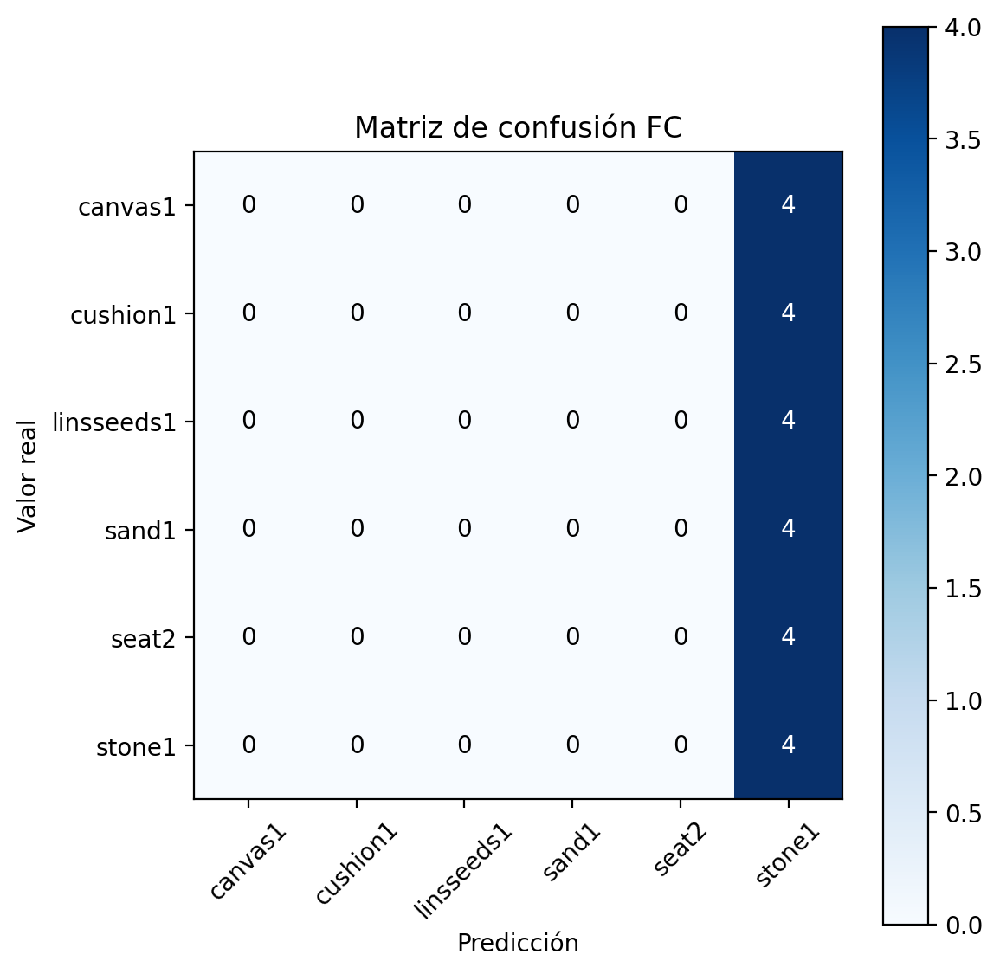

In [ ]:
from summary_results.eval_results import  compute_metrics, plot_confusion_matrix
from sklearn.metrics import confusion_matrix
metrics_val = compute_metrics(y_test_labels, y_pred)
# 4) Matriz de confusión (2D)
cm = confusion_matrix(y_test_labels, y_pred)

# 5) Plot de la matriz de confusión
plot_confusion_matrix(
    cm,
    classes=class_names,          # o None si no tienes nombres
    cmap="Blues",
    title="Matriz de confusión FC",
    # si ya añadiste estos parámetros a la función:
    plot_flag=True,
    save_folder="files",
    file_name="Conf_Mat_FC.png",
    show=True,                    # o False si solo quieres guardarla
)

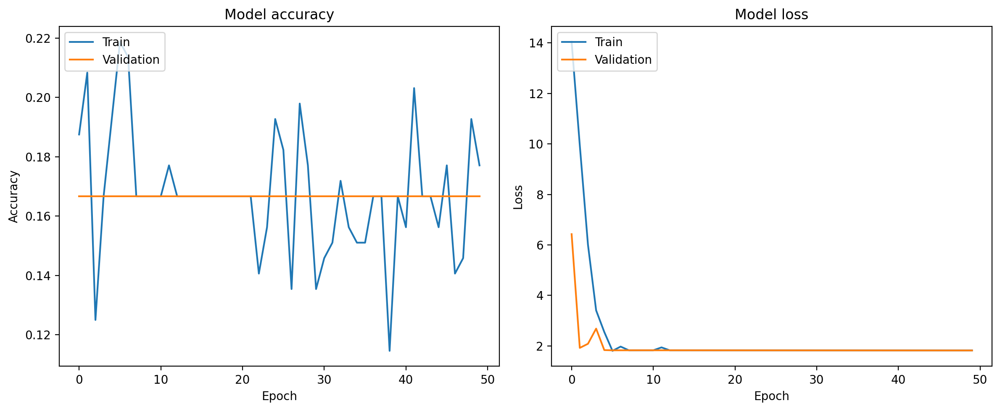

In [ ]:
from summary_results.eval_results import plot_acc_loss

plot_acc_loss(history, save_folder="figures", file_name="acc_loss_FC.png", show=True)

In [ ]:
from summary_results.summary import build_experiment_row, save_experiment_summary
df_row = build_experiment_row(
    name_model='FC',
    steps=None,
    process_name = '-',
    metrics_val=metrics_val,
    trainable_params = model.count_params(),
)


df_all = save_experiment_summary("experiments.csv", df_row)

## Clasificación con una CNN

In [ ]:
from dataset_loader.loader import load_split_data
import cv2

X_train, y_train, X_val, y_val, X_test, y_test = load_split_data(
    cv2.IMREAD_GRAYSCALE,
    flag_summary=True,
    train_ratio=0.8,
    val_ratio=0.1,
    balanced_labels=True
)


Has all the images same size? Yes
The size of all the images is: (576, 576)

Number of images per class:
  seat2: 40 images
  stone1: 40 images
  canvas1: 40 images
  cushion1: 40 images
  linsseeds1: 40 images
  sand1: 40 images
Number of train images: 192
  - canvas1: 32 images
  - cushion1: 32 images
  - linsseeds1: 32 images
  - sand1: 32 images
  - seat2: 32 images
  - stone1: 32 images

Number of validation images: 24
  - canvas1: 4 images
  - cushion1: 4 images
  - linsseeds1: 4 images
  - sand1: 4 images
  - seat2: 4 images
  - stone1: 4 images

Number of test images: 24
  - canvas1: 4 images
  - cushion1: 4 images
  - linsseeds1: 4 images
  - sand1: 4 images
  - seat2: 4 images
  - stone1: 4 images


In [ ]:
import numpy as np
import cv2


X_train = np.array(X_train)
X_val   = np.array(X_val)
class_names = np.unique(y_train)

input_size = (256,256)
X_train = np.array([cv2.resize(img, input_size) for img in X_train])
X_val   = np.array([cv2.resize(img, input_size) for img in X_val])
X_test  = np.array([cv2.resize(img, input_size) for img in X_test])

# Normalize [0,1]
X_train = X_train.astype("float32") / 255.0
X_val   = X_val.astype("float32")   / 255.0
X_test   = X_test.astype("float32")   / 255.0


X_train = np.expand_dims(X_train, axis=-1)
X_val   = np.expand_dims(X_val, axis=-1)
X_test  = np.expand_dims(X_test, axis=-1)

print("Train shape:", X_train.shape)
print("Val shape:  ", X_val.shape)



Train shape: (192, 256, 256, 1)
Val shape:   (24, 256, 256, 1)


In [ ]:
# Convertir a categorical one hot
from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

# Convert labels to categorical -> one-hot encoding
le = LabelEncoder()
y_train = le.fit_transform(y_train)
y_val   = le.transform(y_val)
y_test  = le.transform(y_test)


num_classes = np.unique(y_train).shape[0]
y_train = to_categorical(y_train, num_classes)
y_val   = to_categorical(y_val, num_classes)
y_test  = to_categorical(y_test, num_classes)

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense
from keras.optimizers import Adam

model = Sequential()
input_shape = X_train.shape[1:]
# Bloque 1
model.add(Conv2D(32, (3, 3), activation='relu', padding='same',
                 input_shape=input_shape))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Bloque 2
model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Bloque 3
model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Bloque 4
model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))

# Pasar a vector
model.add(Flatten())

# Capa totalmente conectada de size = 128
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))

# Capa de salida
model.add(Dense(num_classes, activation='softmax'))

model.summary()


/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_16 (Conv2D)              │ (None, 256, 256, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_18 (MaxPooling2D) │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 32, 32, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_19 (MaxPooling2D) │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 65536)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 128)            │     8,388,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,777,350 (33.48 MB)

 Trainable params: 8,777,350 (33.48 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
lr = 5e-4
optimizer = Adam(learning_rate=lr, )

model.compile(
    loss='categorical_crossentropy',
    optimizer=optimizer,
    metrics=['accuracy']
)

from keras.callbacks import EarlyStopping

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=15,
    restore_best_weights=True
)

history = model.fit(
    X_train, y_train,
    batch_size=32,
    epochs=50,
    validation_data=(X_val, y_val),
    callbacks=[early_stop],
    shuffle=True
)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 257ms/step - accuracy: 0.1740 - loss: 1.8322 - val_accuracy: 0.1667 - val_loss: 1.7868
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - accuracy: 0.1719 - loss: 1.7883 - val_accuracy: 0.2500 - val_loss: 1.7660
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - accuracy: 0.2557 - loss: 1.7593 - val_accuracy: 0.3333 - val_loss: 1.7366
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - accuracy: 0.3130 - loss: 1.6980 - val_accuracy: 0.1667 - val_loss: 1.7198
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - accuracy: 0.2969 - loss: 1.6206 - val_accuracy: 0.4583 - val_loss: 1.3929
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - accuracy: 0.4554 - loss: 1.4187 - val_accuracy: 0.5417 - val_loss: 1.1546
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.5217 - loss: 1.2004 - val_accuracy: 0.6667 - val_loss: 0.9169
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - accuracy: 0.6139 - loss: 1.0347 - val_accuracy: 0.8333 - val_loss: 0.7862

First, define a function that describes how your learning rate should change over epochs. This function will receive the epoch number as an argument and return the new learning rate.

In [ ]:
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler
import numpy as np

def lr_schedule(epoch):
    initial_lr = 0.001
    if epoch < 10:
        return initial_lr
    elif epoch < 20:
        return initial_lr * 0.1
    else:
        return initial_lr * 0.01

print(f"Learning rate at epoch 5: {lr_schedule(5)}")
print(f"Learning rate at epoch 15: {lr_schedule(15)}")
print(f"Learning rate at epoch 25: {lr_schedule(25)}")

Next, create an instance of the `LearningRateScheduler` callback, passing your `lr_schedule` function to it. You will then pass this callback to the `callbacks` argument of `model.fit()`.

In [ ]:
# Assuming 'model' is your compiled Keras model
# and X_train, y_train, X_val, y_val are your data

# Instantiate the Adam optimizer with an initial learning rate (it will be overridden by the scheduler)
optimizer = Adam(learning_rate=lr_schedule(0)) # Pass the initial LR from your scheduler

# Compile the model with the optimizer
# For demonstration, let's assume a simple model for compilation
# (you would use your actual model from the notebook)
num_classes = 6 # Example, replace with your actual num_classes
input_shape = (256, 256, 1) # Example, replace with your actual input_shape

model_placeholder = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=input_shape),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(num_classes, activation='softmax')
])

model_placeholder.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Create the learning rate scheduler callback
lr_callback = LearningRateScheduler(lr_schedule)

print("Model compiled and LearningRateScheduler created.")
print("You would then train your model like this:")
print("model.fit(X_train, y_train, epochs=30, validation_data=(X_val, y_val), callbacks=[lr_callback])")

# Example of fitting (commented out as actual data/model from notebook would be used)
# history = model.fit(X_train, y_train, batch_size=32,
#                     epochs=30, validation_data=(X_val, y_val),
#                     callbacks=[lr_callback], shuffle = True)


In this setup, the `lr_schedule` function will be called at the beginning of each epoch to determine the learning rate for that epoch, effectively controlling the learning rate decay.

In [ ]:
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test accuracy:', test_acc)
print('Test loss:', test_loss)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.9583 - loss: 0.2102
Test accuracy: 0.9583333134651184
Test loss: 0.21016772091388702


In [ ]:
y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)     # (n_samples,)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


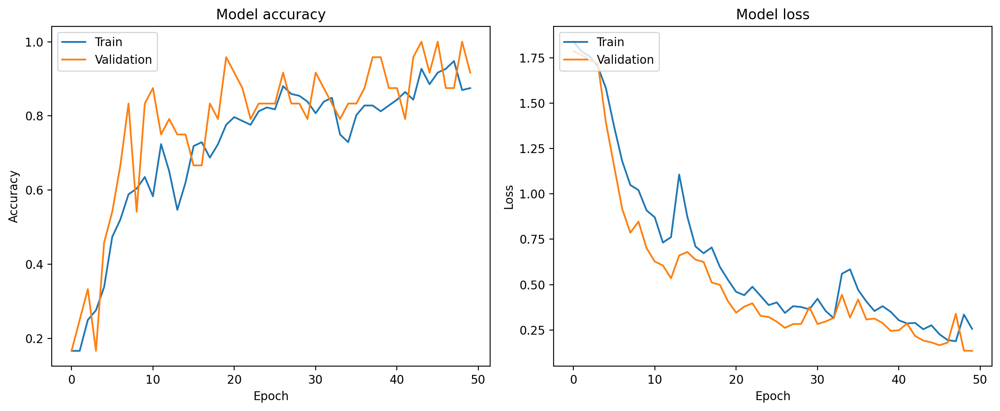

In [ ]:
from summary_results.eval_results import plot_acc_loss
plot_acc_loss(history, save_folder="figures", file_name="acc_loss_CNN.png", show=True)

Acc: 0.96
Prec: 0.97
Rec: 0.96
F1: 0.96


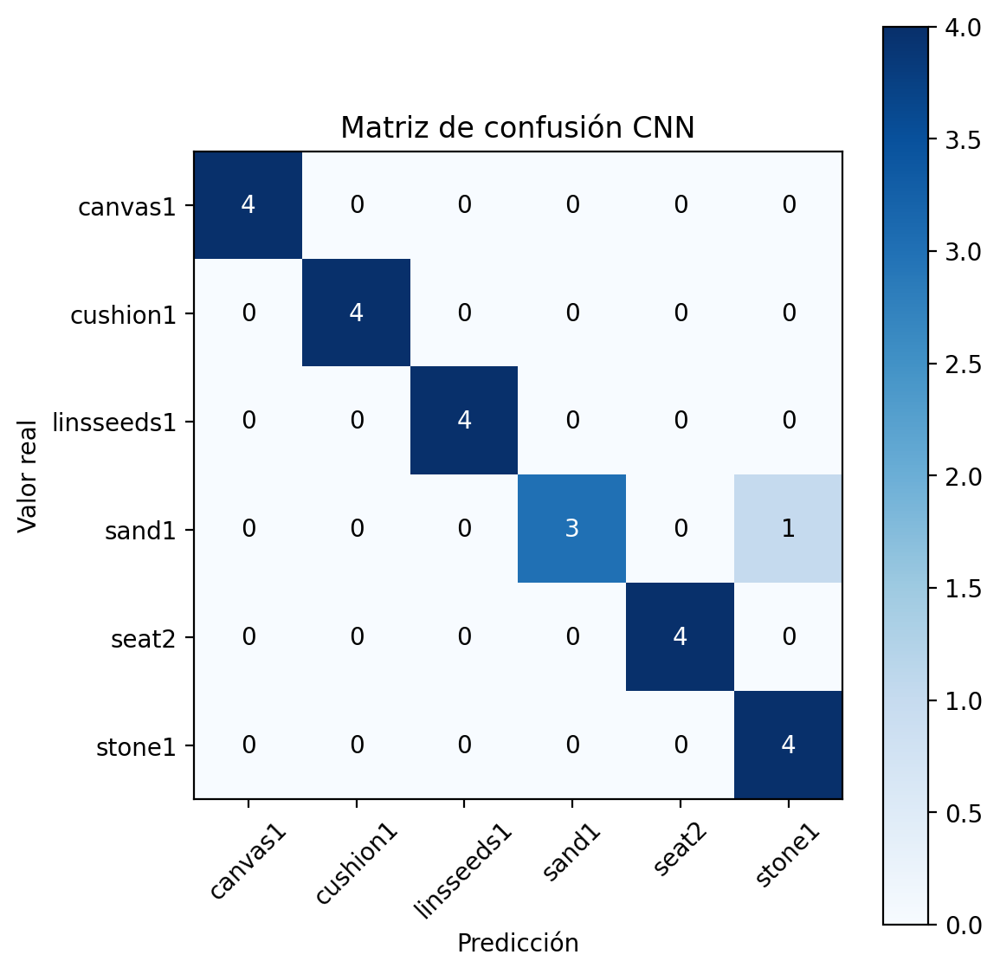

In [ ]:
from summary_results.eval_results import  compute_metrics, plot_confusion_matrix
from sklearn.metrics import confusion_matrix
metrics_val = compute_metrics(y_test_labels, y_pred)
# 4) Matriz de confusión (2D)
cm = confusion_matrix(y_test_labels, y_pred)

# 5) Plot de la matriz de confusión
plot_confusion_matrix(
    cm,
    classes=class_names,          # o None si no tienes nombres
    cmap="Blues",
    title="Matriz de confusión CNN",
    # si ya añadiste estos parámetros a la función:
    plot_flag=True,
    save_folder="files",
    file_name="Conf_Mat_CNN.png",
    show=True,                    # o False si solo quieres guardarla
)

In [ ]:
from summary_results.summary import build_experiment_row, save_experiment_summary
df_row = build_experiment_row(
    name_model='CNN',
    steps=None,
    process_name = '-',
    metrics_val=metrics_val,
    trainable_params = model.count_params(),
)


df_all = save_experiment_summary("experiments.csv", df_row)

## Show results

In [ ]:
import pandas as pd

df = pd.read_csv('experiments.csv')
df.head()

,timestamp,model_name,process_name,pipeline_features,num_vars,trainable_params,accuracy_val,precision_val,recall_val,f1_val
0,2025-12-01T17:32:00,SGD_Classifier,NaN,HOG,181476.0,NaN,0.71,0.75,0.71,0.70
1,2025-12-01T17:32:06,KNN 3 neighbors,NaN,HOG,181476.0,NaN,0.17,0.03,0.17,0.05
2,2025-12-01T17:32:49,SGD_Classifier,NaN,GLCM global,24.0,NaN,1.00,1.00,1.00,1.00
3,2025-12-01T17:32:51,KNN 3 neighbors,NaN,GLCM global,24.0,NaN,1.00,1.00,1.00,1.00
4,2025-12-01T17:34:10,SGD_Classifier,NaN,LBP,32.0,NaN,0.99,0.99,0.99,0.99


In [ ]:
df.loc[df.index[-4:], "pipeline_features"] = [
    "SIFT + BoVW",
    "SIFT + BoVW",
    "SIFT + VLAD",
    "SIFT + VLAD",
]

In [ ]:
df.to_csv("experiments.csv", index=False)